In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
from scipy.sparse import lil_matrix
import scipy
from numpy import linalg
import numpy as np
from tqdm import tqdm
from scipy.sparse.linalg import spsolve
import matplotlib.pyplot as plt
import pickle

# Функции формы 4-х угольного элемента в координатах ksi, eta
def N_1(e, n):
    return 1/4*(1-e)*(1-n)
def N_2(e, n):
    return 1/4*(1+e)*(1-n)
def N_3(e, n):
    return 1/4*(1+e)*(1+n)
def N_4(e, n):
    return 1/4*(1-e)*(1+n)

# производные x/y по ksi/eta
def dx_dksi(arr, e, n):
    return 1/4*(arr[0]*(n-1)+arr[1]*(1-n)+arr[2]*(1+n)+arr[3]*(-1-n))
def dy_dksi(arr, e, n):
    return 1/4*(arr[0]*(n-1)+arr[1]*(1-n)+arr[2]*(1+n)+arr[3]*(-1-n))
def dx_deta(arr, e, n):
    return 1/4*(arr[0]*(e-1)+arr[1]*(-1-e)+arr[2]*(1+e)+arr[3]*(1-e))
def dy_deta(arr, e, n):
    return 1/4*(arr[0]*(e-1)+arr[1]*(-1-e)+arr[2]*(1+e)+arr[3]*(1-e))


def dN_ksi_eta(e, n):
    return 1/4*np.array([[n-1, 1-n, 1+n, -1-n],[e-1, -1-e, 1+e, 1-e]])
def Jacob(x_arr, y_arr, e, n):
    return np.array([[dx_dksi(x_arr, e, n), dy_dksi(y_arr, e, n)], [dx_deta(x_arr, e, n), dy_deta(y_arr, e, n)]])

def Jacob_inv(x_arr, y_arr, e, n):
    res = np.array([[dy_deta(y_arr, e, n), -dy_dksi(y_arr, e, n)], [-dx_deta(x_arr, e, n), dx_dksi(x_arr, e, n)]])
    #res = np.array([[dy_deta(y_arr, e, n), -dx_deta(x_arr, e, n)], [-dy_dksi(y_arr, e, n), dx_dksi(x_arr, e, n)]])
    b = np.linalg.det(res)
    return 1/b*res, b

def dN_x_y(inv_jac, e, n):
    return inv_jac@dN_ksi_eta(e, n)

def build_B(mat):
    dN1_dx = mat[0,0]
    dN2_dx = mat[0,1]
    dN3_dx = mat[0,2]
    dN4_dx = mat[0,3]
    dN1_dy = mat[1,0]
    dN2_dy = mat[1,1]
    dN3_dy = mat[1,2]
    dN4_dy = mat[1,3]
    return np.array([[dN1_dx, 0, dN2_dx, 0, dN3_dx, 0, dN4_dx, 0],
                     [0, dN1_dy, 0, dN2_dy, 0, dN3_dy, 0, dN4_dy],
                     [dN1_dy, dN1_dx, dN2_dy, dN2_dx, dN3_dy, dN3_dx, dN4_dy, dN4_dx]])

def build_D(E, nu):
    return E/(1-nu**2)*np.array([[1, nu, 0],[nu, 1, 0], [0, 0, (1-nu)/2]])

def build_local_K(x_arr, y_arr, D_mat):
    cnst = np.sqrt(3)
    res = np.zeros((8,8))
    points = [(-1.0/cnst, -1.0/cnst), (1.0/cnst, -1.0/cnst), (1.0/cnst, 1.0/cnst), (-1.0/cnst, 1.0/cnst)]
    for point in points:
        inv_jac, j_det = Jacob_inv(x_arr, y_arr, point[0], point[1])
        mat1 = dN_x_y(inv_jac, point[0], point[1])
        B_mat = build_B(mat1)
        res += (((B_mat.T@D_mat)@B_mat)*j_det)
    return res

def build_N(e, n):
    N1 = N_1(e, n)
    N2 = N_2(e, n)
    N3 = N_3(e, n)
    N4 = N_4(e, n)
    return np.array([[N1, 0.0, N2, 0.0, N3, 0.0, N4, 0.0], [0.0, N1, 0.0, N2, 0.0, N3, 0.0, N4]])

def build_local_M(x_arr, y_arr, ro):
    cnst = np.sqrt(3)
    res = np.zeros((8,8))
    points = [(-1.0/cnst, -1.0/cnst), (1.0/cnst, -1.0/cnst), (1.0/cnst, 1.0/cnst), (-1.0/cnst, 1.0/cnst)]
    for point in points:
        inv_jac, j_det = Jacob_inv(x_arr, y_arr, point[0], point[1])
        NN = build_N(point[0], point[1])
        res += ((NN.T@NN)*j_det*ro)
    return res

def build_global_K_quad(verts, triag, E, nu):
    global_K = lil_matrix((verts.shape[0]*2, verts.shape[0]*2))
    for m in range(triag.shape[0]):
        x_arr = verts[triag[m], 0]
        y_arr = verts[triag[m], 1]
        D_mat = build_D(E, nu)
        local_k = build_local_K(x_arr, y_arr, D_mat)
        for i in range(8):
            for j in range(8):
                global_K[2 * triag[m][i // 2] + i % 2, 2 * triag[m][j // 2] + j % 2] += local_k[i, j]
    return global_K

def build_global_M(verts, triag, ro):
    global_M = lil_matrix((verts.shape[0]*2, verts.shape[0]*2))
    for m in tqdm(range(triag.shape[0])):
        x_arr = verts[triag[m], 0]
        y_arr = verts[triag[m], 1]
        local_m = build_local_M(x_arr, y_arr, ro)
        for i in range(8):
            for j in range(8):
                global_M[2 * triag[m][i // 2] + i % 2, 2 * triag[m][j // 2] + j % 2] += local_m[i, j]
    return global_M

def get_elem_area(verts, triag, i):
    x1 = verts[triag[i][0]][0]
    y1 = verts[triag[i][0]][1]
    x2 = verts[triag[i][1]][0]
    y2 = verts[triag[i][1]][1]
    x3 = verts[triag[i][2]][0]
    y3 = verts[triag[i][2]][1]
    x4 = verts[triag[i][2]][0]
    y4 = verts[triag[i][2]][1]
    cur_det = np.array([[x1, y1, 1], [x2, y2, 1], [x3, y3, 1]])
    elem_area = np.abs(1/2*np.linalg.det(cur_det))
    cur_det = np.array([[x3, y3, 1], [x4, y4, 1], [x1, y1, 1]])
    elem_area += np.abs(1/2*np.linalg.det(cur_det))
    return elem_area

def get_elem_area_gener(x1, y1, x2, y2, x3, y3):
    cur_det = np.array([[x1, y1, 1], [x2, y2, 1], [x3, y3, 1]])
    elem_area = np.abs(1/2*np.linalg.det(cur_det))
    return elem_area

def is_node_in_triag(verts, triag, i, x5, y5, eps = 0.000001):
    x1 = verts[triag[i][0]][0]
    y1 = verts[triag[i][0]][1]
    x2 = verts[triag[i][1]][0]
    y2 = verts[triag[i][1]][1]
    x3 = verts[triag[i][2]][0]
    y3 = verts[triag[i][2]][1]
    S0 = get_elem_area_gener(x1, y1, x2, y2, x3, y3)
    S1 = get_elem_area_gener(x5, y5, x2, y2, x3, y3)
    S2 = get_elem_area_gener(x1, y1, x5, y5, x3, y3)
    S3 = get_elem_area_gener(x1, y1, x2, y2, x5, y5)
    if abs(S0 - S1 - S2 -S3) <eps:
        return True
    
    x1 = verts[triag[i][2]][0]
    y1 = verts[triag[i][2]][1]
    x2 = verts[triag[i][3]][0]
    y2 = verts[triag[i][3]][1]
    x3 = verts[triag[i][0]][0]
    y3 = verts[triag[i][0]][1]
    S0 = get_elem_area_gener(x1, y1, x2, y2, x3, y3)
    S1 = get_elem_area_gener(x5, y5, x2, y2, x3, y3)
    S2 = get_elem_area_gener(x1, y1, x5, y5, x3, y3)
    S3 = get_elem_area_gener(x1, y1, x2, y2, x5, y5)
    if abs(S0 - S1 - S2 -S3) <eps:
        return True
    return False
    
def make_n_vec_clear(verts, data):    
    n_vec = []
    for i in range(data.shape[0]):
        nx = verts[data[i][2]][1] - verts[data[i][1]][1]
        ny = verts[data[i][1]][0] - verts[data[i][2]][0]
        nx = nx/np.sqrt(nx**2+ny**2)
        ny = ny/np.sqrt(nx**2+ny**2)
        test_x = verts[data[i][2]][0] - verts[data[i][3]][0]
        test_y = verts[data[i][2]][1] - verts[data[i][3]][1]
        if test_x*nx +test_y*ny < 0:
            nx = -nx
            ny = -ny
        n_vec.append([nx, ny])
    n_vec = np.array(n_vec)
    return n_vec
    
def apply_pressure(verts, data, global_F, P):
    n_vec = make_n_vec_clear(verts, data)
    for i in range(data.shape[0]):
        l = np.sqrt(np.sum((verts[data[i][1]]- verts[data[i][2]])**2))
        global_F[2*data[i][1], 0] += (P*n_vec[i][0]*l)
        global_F[2*data[i][1]+1, 0] += (P*n_vec[i][1]*l)
        global_F[2*data[i][2], 0] += (P*n_vec[i][0]*l)
        global_F[2*data[i][2]+1, 0] += (P*n_vec[i][1]*l)
    return global_F

def apply_fixes(global_K, global_F, data, moves):
    fixes = list(set(data[:,1]) | set(data[:,2]))
    for i in range(len(fixes)):
        if moves[0] is not None:
            x = 2*fixes[i]
            global_F[x,0]=moves[0]
            extra_F = lil_matrix(global_F.shape)
            extra_F[x,0]=moves[0]
            global_F -= np.dot(global_K, extra_F)
            global_K[x,:]=0
            global_K[:,x]=0
            global_K[x,x]=1
        if moves[1] is not None:
            x = 2*fixes[i]+1
            global_F[x,0]=moves[1]
            extra_F = lil_matrix(global_F.shape)
            extra_F[x,0]=moves[1]
            global_F -= np.dot(global_K, extra_F)
            global_K[x,:]=0
            global_K[:,x]=0
            global_K[x,x]=1
    return global_K, global_F

def obtain_result_for_elem(triag, x_arr, y_arr, U, D, i):
    u_loc = np.zeros((8,1))
    u_loc[0] = U[triag[i][0]*2][0]
    u_loc[1] = U[triag[i][0]*2+1][0]
    u_loc[2] = U[triag[i][1]*2][0]
    u_loc[3] = U[triag[i][1]*2+1][0]
    u_loc[4] = U[triag[i][2]*2][0]
    u_loc[5] = U[triag[i][2]*2+1][0]
    u_loc[6] = U[triag[i][3]*2][0]
    u_loc[7] = U[triag[i][3]*2+1][0]
    inv_jac, j_det = Jacob_inv(x_arr, y_arr, 0.0, 0.0)
    mat1 = dN_x_y(inv_jac, 0.0, 0.0)
    B_mat = build_B(mat1)
    strain = B_mat.dot(u_loc)
    stress = D.dot(strain)
    return stress, strain

def get_all_stress_and_strain(triag, verts, U, E, nu):
    stress_data = np.zeros((triag.shape[0],3))
    strain_data = np.zeros((triag.shape[0],3))
    D = build_D(E, nu)
    for i in tqdm(range(triag.shape[0])):
        x_arr = verts[triag[i], 0]
        y_arr = verts[triag[i], 1]
        stress, strain = obtain_result_for_elem(triag, x_arr, y_arr, U, D, i)
        stress_data[i] = stress.reshape(1,-1)
        strain_data[i] = strain.reshape(1,-1)
    return stress_data, strain_data

class palette1:
    def __init__(self, col):
        self.data = dict()
        for i in range(255):
            self.data[i+1]=i/255
        self.max_=col.max()
        self.min_=col.min()
        self.l1 = len(self.data)
    def obtain_color(self, val):
        delta=(self.l1-1)*(val-self.min_)/(self.max_-self.min_)
        if np.isnan(delta):
            delta = 0
        return [0.1, self.data[int(delta)+1], 0.1]

def vzz(stress_data, triag, verts, p, col=0, a1=18,a2=9, name='stress', axis='x'):
    cur_palette = palette1(stress_data[:,col])
    plt.figure(figsize = (a1,a2))
    for i in tqdm(range(triag.shape[0])):
        color=cur_palette.obtain_color(stress_data[i][col])
        plt.fill([verts[triag[i][0]][0],
                  verts[triag[i][1]][0],
                  verts[triag[i][2]][0],
                  verts[triag[i][3]][0],
                  verts[triag[i][0]][0]], 
                 [verts[triag[i][0]][1],
                  verts[triag[i][1]][1],
                  verts[triag[i][2]][1],
                  verts[triag[i][3]][1],
                  verts[triag[i][0]][1]], color=color)
    plt.title(axis+' '+name)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.savefig("{}.png".format(p))
    plt.show()
        
def NewMarkc22(verts, triag, left_data, right_data, up_data, down_data, inner_data, min1, E, nu, ro, P, dmp, filename_1, eps=0.001):
    logs = []
    dt=min1/(2*np.sqrt(E/ro)) # tau, min1 = min_delta_h
    k_glob = build_global_K_quad(verts, triag, E, nu)
    f_glob = lil_matrix((2*verts.shape[0], 1))
    f_glob = apply_pressure(verts, right_data, f_glob, P)
    k_glob, f_glob = apply_fixes(k_glob, f_glob, left_data, [0, None])
    k_glob, f_glob = apply_fixes(k_glob, f_glob, down_data, [None, 0])
    m_glob = build_global_M(verts, triag, ro)
    v = scipy.sparse.lil_matrix.sum(m_glob, axis=1)
    m_glob = lil_matrix((verts.shape[0]*2, verts.shape[0]*2))
    for i in tqdm(range(v.shape[0])):
        m_glob[i,i]=1/v[i,0]
    alpha = np.zeros((2*verts.shape[0], 1))
    U = np.zeros((2*verts.shape[0], 1))
    dU = np.zeros((2*verts.shape[0], 1))
    t = 0
    p=0
    i=1
    k = 0
    while True:
        U1 = U+dU*dt+alpha*(dt**2)/2
        alpha1 = ((m_glob*1/(1+dmp*dt/2))@(f_glob-(k_glob@U1)))-(dU+1/2*alpha*dt)*1/(1+dmp*dt/2)*dmp
        dU1 = dU + (alpha+alpha1)/2 * dt
        val = np.max(np.abs(U-U1))
        U=U1
        dU = dU1
        alpha = alpha1
        val2 = np.max(dU)

        k += 1
        if k%100==0:
          print("max_dU: ", val2)
        if i>1 and val2<eps:
            break
        logs.append((i,t,val,val2))
        i+=1
        t+=dt
    stress_data, strain_data = get_all_stress_and_strain(triag, verts, U1, E, nu)
    vzz(stress_data, triag, verts, p, col=0, a1=9, a2=9)
    vzz(stress_data, triag, verts, p, col=1, a1=9, a2=9)
    vzz(stress_data, triag, verts, p, col=2, a1=9, a2=9)
    logs = (logs, U1)
    print("num iters:", k)
    with open(filename_1+".pickle", "wb") as file:
        pickle.dump(logs, file)
        
def NewMarkc24(verts, triag, left_data, right_data, up_data, down_data, inner_data, min1, E, nu, ro, P, dmp, filename_1, eps=0.001):
    logs = []
    dt=min1*0.5/np.sqrt(E/ro)
    k_glob = build_global_K_quad(verts, triag, E, nu)
    f_glob = lil_matrix((2*verts.shape[0], 1))
    f_glob = apply_pressure(verts, right_data, f_glob, P)
    k_glob, f_glob = apply_fixes(k_glob, f_glob, left_data, [0, None])
    k_glob, f_glob = apply_fixes(k_glob, f_glob, down_data, [None, 0])
    m_glob = build_global_M(verts, triag, ro)
    v = scipy.sparse.lil_matrix.sum(m_glob, axis=1)
    m_glob = lil_matrix((verts.shape[0]*2, verts.shape[0]*2))
    for i in tqdm(range(v.shape[0])):
        m_glob[i,i]=1/v[i,0]
    alpha = np.zeros((2*verts.shape[0], 1))
    U = np.zeros((2*verts.shape[0], 1))
    dU = np.zeros((2*verts.shape[0], 1))
    t = 0
    p=0
    i=1
    while True:
        U1 = U+dU*dt+alpha*(dt**2)/2
        #dU1 = dU + (alpha) * dt
        alpha1 = ((m_glob*1/(1+dmp*dt/2))@(f_glob-(k_glob@U1)))-(dU+1/2*alpha*dt)*1/(1+dmp*dt/2)*dmp
        dU1 = dU + (alpha+alpha1)/2 * dt
        #print("time: ", t)
        val = np.max(np.abs(U-U1))
        #print("u_diff: ",val)
        U=U1
        dU = dU1
        alpha = alpha1
        val2 = np.max(dU)
        print("max_dU: ", val2)
        if i>1 and val2<eps:
            break
        logs.append((i,t,val,val2))
        i+=1
        t+=dt
    stress_data, strain_data = get_all_stress_and_strain(triag, verts, U1, E, nu)
    vzz(stress_data, triag, verts, p, col=0, a1=18, a2=9)
    logs = (logs, U1)
    return i
        
def NewMarkc23(verts, triag, left_data, right_data, up_data, down_data, inner_data, min1, E, nu, ro, P, dmp, filename_1, eps=0.01):
    logs = []
    dt=min1*0.5/np.sqrt(E/ro)
    k_glob = build_global_K_quad(verts, triag, E, nu)
    f_glob = lil_matrix((2*verts.shape[0], 1))
    f_glob = apply_pressure(verts, right_data, f_glob, P)
    k_glob, f_glob = apply_fixes(k_glob, f_glob, left_data, [0, None])
    k_glob, f_glob = apply_fixes(k_glob, f_glob, down_data, [None, 0])
    m_glob = build_global_M(verts, triag, ro)
    v = scipy.sparse.lil_matrix.sum(m_glob, axis=1)
    m_glob = lil_matrix((verts.shape[0]*2, verts.shape[0]*2))
    for i in tqdm(range(v.shape[0])):
        m_glob[i,i]=1/v[i,0]
    alpha = np.zeros((2*verts.shape[0], 1))
    U = np.zeros((2*verts.shape[0], 1))
    dU = np.zeros((2*verts.shape[0], 1))
    t = 0
    p=0
    i=1
    while True:
        U1 = U+dU*dt+alpha*(dt**2)/2
        #dU1 = dU + (alpha) * dt
        alpha1 = ((m_glob*1/(1+dmp*dt/2))@(f_glob-(k_glob@U1)))-(dU+1/2*alpha*dt)*1/(1+dmp*dt/2)*dmp
        dU1 = dU + (alpha+alpha1)/2 * dt
        #print("time: ", t)
        val = np.max(np.abs(U-U1))
        #print("u_diff: ",val)
        U=U1
        dU = dU1
        alpha = alpha1
        val2 = np.max(dU)
        print("max_dU: ", val2)
        if i>1 and val2<eps:
            break
        logs.append((i,t,val,val2))
        i+=1
        t+=dt
        if i%10 == 0 and i<600:
            print("time: ", t-dt)
            stress_data, strain_data = get_all_stress_and_strain(triag, verts, U1, E, nu)
            vzz(stress_data, triag, verts, p, col=0, a1=18, a2=9)
    print("time: ", t-dt)
    stress_data, strain_data = get_all_stress_and_strain(triag, verts, U1, E, nu)
    vzz(stress_data, triag, verts, p, col=0, a1=18, a2=9)
    logs = (logs, U1)

def build_N_resultantov(e, n):
    N1 = N_1(e, n)
    N2 = N_2(e, n)
    N3 = N_3(e, n)
    N4 = N_4(e, n)
    return np.array([N1, N2, N3, N4])

def build_local_C(x_arr, y_arr):
    cnst = np.sqrt(3)
    res = np.zeros((4,4))
    points = [(-1.0/cnst, -1.0/cnst), (1.0/cnst, -1.0/cnst), (1.0/cnst, 1.0/cnst), (-1.0/cnst, 1.0/cnst)]
    for point in points:
        inv_jac, j_det = Jacob_inv(x_arr, y_arr, point[0], point[1])
        NN = build_N_resultantov(point[0], point[1])
        res += ((NN.T@NN)*j_det)
    return res

def build_global_C(verts, triag):
    global_C = lil_matrix((verts.shape[0], verts.shape[0]))
    for m in tqdm(range(triag.shape[0])):
        x_arr = verts[triag[m], 0]
        y_arr = verts[triag[m], 1]
        local_c = build_local_C(x_arr, y_arr)
        for i in range(4):
            for j in range(4):
                global_C[triag[m][i], triag[m][j]] += local_c[i, j]
    return global_C

def MethodResultantov4(data, verts, elements):
    R = np.zeros(len(verts))
    for key, val in enumerate(elements):
        x1, y1 = verts[val[0]]
        x2, y2 = verts[val[1]]
        x3, y3 = verts[val[2]]
        x4, y4 = verts[val[3]]

        s_osn = 1/2*np.abs((x1*y2-x2*y1)+(x2*y3-x3*y2)+(x3*y4-x4*y3)+(x4*y1-x1*y4))

        R[[val[0], val[1], val[2], val[3]]] += data[key] * s_osn/3

    C = build_global_C(verts, elements)
    C = C.todense()
    res = np.linalg.solve(C, R)
    return res

from itertools import product
def MethodResultantov(data, verts, elements):
    C = np.zeros(shape=(len(verts), len(verts)))
    R = np.zeros(len(verts))
    for key, val in enumerate(elements):
        for i in range(2):
          for k in range(i+1, 3):
            for l in range(k+1, 4):
              if is_triangle(verts[val[i]], verts[val[k]], verts[val[l]]) and is_triangle(verts[val[(i+2)%4]], verts[val[(k+2)%4]], verts[val[(l+2)%4]]):
                trs = [[i, k, l], [(i+2)%4, (k+2)%4, (l+2)%4]]
                break

        for i in range(2):
          x1, y1 = verts[val[trs[i][0]]]
          x2, y2 = verts[val[trs[i][1]]]
          x3, y3 = verts[val[trs[i][2]]]
          dlt = abs((x1 - x3) * (y2 - y3) - (x2 - x3) * (y1 - y3)) / 2
          R[[val[trs[i][0]], val[trs[i][1]], val[trs[i][2]]]] += data[key] * dlt/3
          for n1, n2 in product([val[trs[i][0]], val[trs[i][1]], val[trs[i][2]]],
                                [val[trs[i][0]], val[trs[i][1]], val[trs[i][2]]]):
              if n1 == n2:
                  C[n1, n2] += dlt/6
              else:
                  C[n1, n2] += dlt/12
    res = np.linalg.solve(C, R)
    return res


def is_triangle(vertex1, vertex2, vertex3):
    side1 = ((vertex2[0] - vertex1[0])**2 + (vertex2[1] - vertex1[1])**2)**0.5
    side2 = ((vertex3[0] - vertex2[0])**2 + (vertex3[1] - vertex2[1])**2)**0.5
    side3 = ((vertex1[0] - vertex3[0])**2 + (vertex1[1] - vertex3[1])**2)**0.5

    if side1 + side2 > side3 and side2 + side3 > side1 and side3 + side1 > side2:
        return True
    else:
        return False

def ElemantsArea_gener(x1, y1, x2, y2, x3, y3):
    cur_det = np.array([[x1, y1, 1], [x2, y2, 1], [x3, y3, 1]])
    elem_area = np.abs(1/2*np.linalg.det(cur_det))
    return elem_area

def IsPointInElem(x, y, x1, y1, x2, y2, x3, y3, eps = 0.000001):
    S0 = ElemantsArea_gener(x1, y1, x2, y2, x3, y3)
    S1 = ElemantsArea_gener(x, y, x2, y2, x3, y3)
    S2 = ElemantsArea_gener(x1, y1, x, y, x3, y3)
    S3 = ElemantsArea_gener(x1, y1, x2, y2, x, y)

    # если точка внутри элемента, то сумма площадей трех образованных треугольников равна сумме площади элемента 
    if abs(S0 - S1 - S2 -S3) <eps:
        return True
    return False

def interpolation(x, y, verts_value, verts, elems, j):
    for i in range(2):
      for k in range(i+1, 3):
        for l in range(k+1, 4):
          if is_triangle(verts[elems[j][i]], verts[elems[j][k]], verts[elems[j][l]]):
            if IsPointInElem(x, y, verts[elems[j][i]][0], verts[elems[j][i]][1], verts[elems[j][k]][0], verts[elems[j][k]][1], verts[elems[j][l]][0], verts[elems[j][l]][1], eps=1e-10):
              nodes = [elems[j][i], elems[j][k], elems[j][l]]
              break

    F = [verts_value[nodes[0]], verts_value[nodes[1]], verts_value[nodes[2]]]
    X = [verts[nodes[0]][0], verts[nodes[1]][0], verts[nodes[2]][0]]
    Y = [verts[nodes[0]][1], verts[nodes[1]][1], verts[nodes[2]][1]]
    """
    N1 = ((y2 - y3)x + (x3 - x2)y + x2y3 - x3y2)/(2delta)
    N2 = ((y3 - y1)x + (x1 - x3)y + x3y1 - x1y3)/(2delta)
    N3 = ((y1 - y2)x + (x2 - x1)y + x1y2 - x2y1)/(2delta)
    """
    b = [Y[i%3] - Y[(i+1)%3] for i in range(1, 4)] # b = [Y[1]-Y[2], Y[2]-Y[0], Y[0]-Y[1]] - коэф при x
    c = [-X[i%3] + X[(i+1)%3] for i in range(1, 4)] # коэф при y
    a = [X[i%3] * Y[(i+1)%3] - X[(i+1)%3] * Y[i%3] for i in range(1, 4)] # коэф свободных членов

    A = ElemantsArea_gener(X[0], Y[0], X[1], Y[1], X[2], Y[2])
    res = 0
    # sigma(x,y) = sum(sigma_i * N_i, i = 1..3)
    for i in range(3):
        # res += N_i*F[i] / 2A
        res += F[i]*(a[i] + b[i] * x + c[i] * y) / (2*A)
    return res

#visual_tools.py


In [3]:
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

def quadroplot(triag, verts, color1="green"):
    plt.figure(figsize = (18,9))
    for elem in triag:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color=color1)
    plt.show()
    
def quadroplot_borders(triag, verts, left_data, right_data, up_data, down_data, inner_data):
    plt.figure(figsize = (18,9))
    for elem in triag:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="green")
    for elem in triag[left_data[:,0]]:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="red")
    for elem in triag[right_data[:,0]]:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="orange")
    for elem in triag[up_data[:,0]]:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="black")
    for elem in triag[down_data[:,0]]:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="blue")
    for elem in triag[inner_data[:,0]]:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="yellow")
    plt.show()

def plot_3D(triag, verts, col, data, a1=15, a2=10, name = 'stress', axis='x'):
    x = np.zeros(triag.shape[0])
    y = np.zeros(triag.shape[0])
    for i in range(triag.shape[0]):
        x[i] = (verts[triag[i][0]][0]+verts[triag[i][1]][0]+verts[triag[i][2]][0]+verts[triag[i][3]][0])/4
        y[i] = (verts[triag[i][0]][1]+verts[triag[i][1]][1]+verts[triag[i][2]][1]+verts[triag[i][3]][1])/4
    z = data[:,col]
    fig = plt.figure(figsize=(a1,a2))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, z, s=1, color='green')
    ax.set_xlabel('х', fontsize=20)
    ax.set_ylabel('у', fontsize=20)
    ax.set_zlabel(axis+' '+name, fontsize=20)
    plt.show()
    
class palette:
    def __init__(self, col):
        self.data = dict()
        for i in range(255):
            self.data[i+1]=i/255
        self.max_=col.max()
        self.min_=col.min()
        self.l1 = len(self.data)
    def obtain_color(self, val):
        delta=(self.l1-1)*(val-self.min_)/(self.max_-self.min_)
        if np.isnan(delta):
            delta = 0
        return [0.1, self.data[int(delta)+1], 0.1]
    
def visualize_res(stress_data, triag, verts, p, col=0, a1=18,a2=9, name='stress', axis='x'):
    cur_palette = palette(stress_data[:,col])
    plt.figure(figsize = (a1,a2))
    for i in tqdm(range(triag.shape[0])):
        color=cur_palette.obtain_color(stress_data[i][col])
        plt.fill([verts[triag[i][0]][0],
                  verts[triag[i][1]][0],
                  verts[triag[i][2]][0],
                  verts[triag[i][3]][0],
                  verts[triag[i][0]][0]], 
                 [verts[triag[i][0]][1],
                  verts[triag[i][1]][1],
                  verts[triag[i][2]][1],
                  verts[triag[i][3]][1],
                  verts[triag[i][0]][1]], color=color)
    plt.title(axis+' '+name)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.savefig("{}.png".format(p))
    plt.show()
    
def plot_1D_quad(data, verts, triag, b1, b2, x=None, y=None, resol=100, direct=0, title1 = "x stress", verbose1=False, verbose2 = False):
    if x is not None:
        y1 = np.linspace(b1,b2, resol)
        x1 = np.zeros(y1.shape)
        x1[::]= x
    elif y is not None:
        x1 = np.linspace(b1,b2, resol)
        y1 = np.zeros(x1.shape)
        y1[::]=y
    if verbose1:
        plt.figure(figsize = (9,9))
        for elem in triag:
            x_ = [verts[:,0][x1_] for x1_ in elem]
            y_ = [verts[:,1][x1_] for x1_ in elem]
            x_.append(x_[0])
            y_.append(y_[0])
            plt.plot(x_,y_,color="green")
        plt.scatter(x1,y1,s=2, color='red')
        #plt.show()
    glob_res = []
    for i in tqdm(range(x1.shape[0])):
        resus = []
        for j in range(triag.shape[0]):
            if is_node_in_triag(verts, triag, j, x1[i], y1[i], eps=1e-10):
                #resus - элемент, в котором есть точка xi yi из нашего разбиения
                resus.append(j)
        if len(resus)>0:
            glob_res.append(resus[0])
        else:
            glob_res.append(-1)
        # glob_res - номера элементов, в которых есть точки из разбиения
    if verbose1:
        for elem in glob_res:
            x_ = [verts[:,0][x1_] for x1_ in triag[elem]]
            y_ = [verts[:,1][x1_] for x1_ in triag[elem]]
            x_.append(x_[0])
            y_.append(y_[0])
            plt.plot(x_,y_,color="blue")
        plt.show()
    if y is not None:
        if verbose2:
            tlt1 = ' across y = {}'.format(y)
            plt.figure(figsize = (9,9))
            plt.title(title1+tlt1)
            plt.plot(x1, data[glob_res][:,direct])
            plt.show()
        return x1, data[glob_res][:,direct]
    elif x is not None:
        if verbose2:
            tlt1 = ' across x = {}'.format(x)
            plt.figure(figsize = (9,9))
            plt.title(title1+tlt1)
            plt.plot(y1, data[glob_res][:,direct])
            plt.show()
        return y1, data[glob_res][:,direct]

def Plot1D_by_angle(data, verts, element, alpha=None, y=None, a=0, b=5, resol=500, direct=0, title1 = "stress", verbose1=False, verbose2 = False):
    if y != None:
      x1 = np.linspace(a, b, resol)
      y1 = np.zeros(x1.shape)
      y1[::]=y
    else:
      if alpha < 0 or alpha > math.pi/2:
        return -1
      if alpha <= math.pi/4:
        len_ = a/math.cos(alpha)
        skip = b/math.cos(alpha)
      else:
        len_ = a/math.sin(alpha)
        skip = b/math.sin(alpha)
      step = np.linspace(b, len_, resol)
      # задаем список разбиений для y формата [старт, конец, количество подможеств]
      x1 = np.zeros(step.shape)
      y1 = np.zeros(step.shape)
      for i in range(y1.shape[0]):
        x1[i] = step[i]*math.cos(alpha)
        y1[i] = step[i]*math.sin(alpha)
    
    # Nx2-список координат середин всех элементов для аналитического решения
    xy = np.zeros((element.shape[0],2))
    for i in range(element.shape[0]):
        xy[i][0] = (verts[element[i][0]][0]+verts[element[i][1]][0]+verts[element[i][2]][0]+verts[element[i][3]][0])/4
        xy[i][1] = (verts[element[i][0]][1]+verts[element[i][1]][1]+verts[element[i][2]][1]+verts[element[i][3]][1])/4

    # заполняем knn.fit точками-серединами элементов
    knn = NearestNeighbors(n_neighbors=15)
    knn.fit(xy)

    # результаты в точке
    resus = []
    # индексы элементов, в которых лежат точки
    arr_idxs = []
    x_ret = []
    y_ret = []

    for i in tqdm(range(x1.shape[0])):
        point = np.array([[x1[i], y1[i]]])
        #dists, idxs = knn.kneighbors(point)
        idxs = knn.kneighbors(point)[1]

        # флаг на то, находится ли точка в каком-то элементе, =1 => не в элементе
        flag = 1
        for j in idxs[0].tolist():
            if is_node_in_triag(verts, element, j, x1[i], y1[i], eps=1e-12):
                flag = 0
                # добавим индекс точки, для которой нашелся элемент
                arr_idxs.append(i)
                # добавляем с resus значение j-го элемента. Это значение присвоится i-й точке
                resus.append(data[j])
                #x_ret.append(x1[i])
                #y_ret.append(data[j])
                break
        if flag == 0:
          x_ret.append(x1[i])
          y_ret.append(resus[-1])
        else:
          x_ret.append(x1[i])
          y_ret.append(0)

    # оставляем только те точки, которые есть в каком-то элементе
    x1 = x1[arr_idxs]
    y1 = y1[arr_idxs]

    # рисование прямой
    if verbose1:
        plt.figure(figsize = (9,9))
        for elem in element:
            x_ = [verts[:,0][x1_] for x1_ in elem]
            y_ = [verts[:,1][x1_] for x1_ in elem]
            x_.append(x_[0])
            y_.append(y_[0])
            plt.plot(x_,y_,color="green")
        plt.scatter(x1,y1,s=2, color='red')

    if verbose2:
        tlt1 = ' across alpha = {}'.format(alpha)
        plt.figure(figsize = (9,9))
        plt.title("angle " + str(alpha)+ ":  "+title1+tlt1)
        plt.plot(x1, resus)
        plt.show()
    return x_ret, y_ret

from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsRegressor
import codecs
import math

def Plot1D_nodes_by_angle(data, verts, element, alpha=None, y=None, a=0, b=5, resol=500, direct=0, title1 = "stress", verbose1=False, verbose2 = False):
    if y != None:
      x1 = np.linspace(a, b, resol)
      y1 = np.zeros(x1.shape)
      y1[::]=y
      
    else:
      if alpha < 0 or alpha > math.pi/2:
        return -1

      if alpha <= math.pi/4:
        len_ = a/math.cos(alpha)
        skip = b/math.cos(alpha)
      else:
        len_ = a/math.sin(alpha)
        skip = b/math.sin(alpha)
      step = np.linspace(b, len_, resol)

      # задаем список разбиений для y формата [старт, конец, количество подможеств]
      x1 = np.zeros(step.shape)
      y1 = np.zeros(step.shape)

      for i in range(y1.shape[0]):
        x1[i] = step[i]*math.cos(alpha)
        y1[i] = step[i]*math.sin(alpha)
    
    # список индексов элементов, в которых находятся точки нашей прямой
    # XY - центры элементов
    xy = np.zeros((element.shape[0],2))
    for i in range(element.shape[0]):
        xy[i][0] = (verts[element[i][0]][0]+verts[element[i][1]][0]+verts[element[i][2]][0]+verts[element[i][3]][0])/4
        xy[i][1] = (verts[element[i][0]][1]+verts[element[i][1]][1]+verts[element[i][2]][1]+verts[element[i][3]][1])/4
    knn = NearestNeighbors(n_neighbors=15)
    knn.fit(xy)
    resus = []
    arr_idxs = []

    x_ret = []
    y_ret = []
    for i in tqdm(range(x1.shape[0])):
        point=np.array([[x1[i], y1[i]]])
        dists, idxs = knn.kneighbors(point)
        flag = 1
        for j in idxs[0].tolist():
            if is_node_in_triag(verts, element, j, x1[i], y1[i], eps=1e-12):
                flag = 0
                arr_idxs.append(i)
                new_val = interpolation(x1[i], y1[i], data, verts, element, j)
                #x_ret.append(x1[i])
                #y_ret.append(new_val)
                resus.append(new_val)
                break
        if flag == 0:
          x_ret.append(x1[i])
          y_ret.append(new_val)
        else:
          x_ret.append(x1[i])
          y_ret.append(0)

    x1 = x1[arr_idxs]
    y1 = y1[arr_idxs]
    if verbose1:
        plt.figure(figsize = (9,9))
        for elem in element:
            x_ = [verts[:,0][x1_] for x1_ in elem]
            y_ = [verts[:,1][x1_] for x1_ in elem]
            x_.append(x_[0])
            y_.append(y_[0])
            plt.plot(x_,y_,color="green")
        plt.scatter(x1,y1,s=2, color='red')
    if verbose2:
        tlt1 = ' across alpha = {}'.format(alpha)
        plt.figure(figsize = (9,9))
        plt.title("angle " + str(alpha)+ ":  "+title1+tlt1)
        plt.plot(x1, resus)
        #plt.plot(x1, stress_a[:,direct])
        plt.xlim([-0.2, 5.2])
        plt.show()
    return x_ret, y_ret


#utils.py

In [4]:
pip install triangle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
import matplotlib.pyplot as plt
import numpy as np
import triangle as tr
from tqdm import tqdm

def circle_border_detection_quad(triag, verts, left_data, right_data, up_data, down_data):
    left_set = set()
    right_set = set()
    up_set = set() 
    down_set = set()
    edges = dict()
    edges1 = dict()
    for i in tqdm(range(triag.shape[0])):
        a = triag[i][0]
        b = triag[i][1]
        if a<b:
            edge = (a,b)
        else:
            edge = (b,a)
        if edge not in edges:
            edges[edge] = 1
        else:
            edges[edge] += 1
        a = triag[i][1]
        b = triag[i][2]
        if a<b:
            edge = (a,b)
        else:
            edge = (b,a)
        if edge not in edges:
            edges[edge] = 1
        else:
            edges[edge] += 1
        a = triag[i][2]
        b = triag[i][3]
        if a<b:
            edge = (a,b)
        else:
            edge = (b,a)
        if edge not in edges:
            edges[edge] = 1
        else:
            edges[edge] += 1
        a = triag[i][0]
        b = triag[i][3]
        if a<b:
            edge = (a,b)
        else:
            edge = (b,a)
        if edge not in edges:
            edges[edge] = 1
        else:
            edges[edge] += 1
    for key in edges:
        if edges[key] == 1:
            edges1[key] = 1
    one_nodes = set()
    for key in edges1:
        one_nodes.add(key[0])
        one_nodes.add(key[1])
    for i in range(left_data.shape[0]):
        left_set.add(left_data[i][1])
        left_set.add(left_data[i][2])
    for i in range(right_data.shape[0]):
        right_set.add(right_data[i][1])
        right_set.add(right_data[i][2])
    for i in range(up_data.shape[0]):
        up_set.add(up_data[i][1])
        up_set.add(up_data[i][2])
    for i in range(down_data.shape[0]):
        down_set.add(down_data[i][1])
        down_set.add(down_data[i][2])
    inner_nodes = set()
    for node in one_nodes:
        if node not in (left_set | right_set | up_set | down_set):
            inner_nodes.add(node)
    ns = list(down_set)
    ns1 = []
    for key in ns:
        ns1.append((key, verts[:,0][key]))
    ns1.sort(key = lambda x: x[1])
    inner_nodes.add(ns1[0][0])
    ns = list(left_set)
    ns1 = []
    for key in ns:
        ns1.append((key, verts[:,1][key]))
    ns1.sort(key = lambda x: x[1])
    inner_nodes.add(ns1[0][0])
    one_nodes = list(inner_nodes)
    inner_triags = set()
    for i in range(triag.shape[0]):
        ind = 0
        for j in range(4):
            if triag[i][j] in one_nodes:
                ind+=1
        if ind == 2:
            inner_triags.add(i) 
    inner_triags = list(inner_triags)
    inner_data = []
    for elem in tqdm(inner_triags):
        res = [elem]
        b = []
        for node in triag[elem]:
            if node in inner_nodes:
                res.append(node)
            else:
                b.append(node)
        res.extend(b)
        inner_data.append(res)
    inner_data = np.array(inner_data).astype(int)
    return inner_data

def obtain_borders(verts, marks, triag, left = -5, right = 5, up = 5, down = -5, a1 = 30, a2 = 30, verbose = True):
    border_elems = []
    for i in tqdm(range(triag.shape[0])):
        border_elems.append(i)
    left_set = []
    left_data = []
    right_set = []
    right_data = []
    inner_set = []
    inner_data = []
    up_set = []
    up_data = []
    down_set = []
    down_data = []
    for elem in tqdm(border_elems):
        ind = 0
        for node in triag[elem]:
            if np.isclose(verts[node][0], left):
                ind+=1
        if ind == 2:
            left_set.append(elem)
        ind = 0
        for node in triag[elem]:
            if np.isclose(verts[node][0], right):
                ind+=1
        if ind == 2:
            right_set.append(elem)
        ind = 0
        for node in triag[elem]:
            if np.isclose(verts[node][1], up):
                ind+=1
        if ind == 2:
            up_set.append(elem)
        ind = 0
        for node in triag[elem]:
            if np.isclose(verts[node][1], down):
                ind+=1
        if ind == 2:
            down_set.append(elem)
    for elem in tqdm(left_set):
        res = [elem]
        b = []
        for node in triag[elem]:
            if np.isclose(verts[node][0], left):
                res.append(node)
            else:
                b.append(node)
        res.extend(b)
        left_data.append(res)
    for elem in tqdm(right_set):
        res = [elem]
        b = []
        for node in triag[elem]:
            if np.isclose(verts[node][0], right):
                res.append(node)
            else:
                b.append(node)
        res.extend(b)
        right_data.append(res)
    for elem in tqdm(up_set):
        res = [elem]
        b = []
        for node in triag[elem]:
            if np.isclose(verts[node][1], up):
                res.append(node)
            else:
                b.append(node)
        res.extend(b)
        up_data.append(res)
    for elem in tqdm(down_set):
        res = [elem]
        b = []
        for node in triag[elem]:
            if np.isclose(verts[node][1], down):
                res.append(node)
            else:
                b.append(node)
        res.extend(b)
        down_data.append(res)
    left_data = np.array(left_data).astype(int)
    right_data = np.array(right_data).astype(int)
    up_data = np.array(up_data).astype(int)
    down_data = np.array(down_data).astype(int)
    inner_data= circle_border_detection_quad(triag, verts, left_data, right_data, up_data, down_data)
    if verbose:
        quadroplot_borders(triag, verts, left_data, right_data, up_data, down_data, inner_data)
    return left_data, right_data, up_data, down_data, inner_data

#k_read.py


In [6]:
import numpy as np
import codecs

def get_verts(filename):
    with codecs.open(filename, mode='r', encoding='utf-8', errors='ignore') as file:
        data = file.read()
    start, end = data.find('NODE'), data.find('ELEMENT_SHELL')
    raw_verts = data[start:end].split('\n')[2:-4]
    tmp = []
    for vert in raw_verts:
        args = vert.split()
        tmp.append([int(args[0])-1, float(args[1]), float(args[2])])
    verts = np.zeros((len(tmp),2))
    for elem in tmp:
        verts[elem[0]][0]=elem[1]
        verts[elem[0]][1]=elem[2]
    return verts
    
def get_triag(filename):
    with codecs.open(filename, mode='r', encoding='utf-8',errors='ignore') as file:
        data = file.read()
    start, end = data.find('ELEMENT_SHELL'), data.find('SET_NODE_LIST')
    raw_verts= data[start:end].split('\n')[1:-1]
    tmp = []
    for vert in raw_verts:
        args = vert.split()
        tmp.append([int(args[0])-1, int(args[2])-1, int(args[3])-1, int(args[4])-1, int(args[5])-1])
    triag = np.zeros((len(tmp),4), dtype = 'int')
    for elem in tmp:
        triag[elem[0]][0] = elem[1]
        triag[elem[0]][1] = elem[2]
        triag[elem[0]][2] = elem[3]
        triag[elem[0]][3] = elem[4]
    return triag

#build_KF.py




In [7]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
import warnings
from tqdm import tqdm
from scipy.sparse.linalg import spsolve
from scipy.sparse import lil_matrix
import sys
import pickle
warnings.filterwarnings('ignore')

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
fnames = ['0.1875.k', '0.09375.k', '0.046875.k', '0.0234375.k', '0.01171875.k']

In [10]:
def run_episode(fnames):
    result_y = dict()
    result_x = dict()
    result_y_nodes = dict()
    result_x_nodes = dict()
    stress_data_dct = dict()
    strain_data_dct = dict()
    stress_nodes_data_dct = dict()
    strain_nodes_data_dct = dict()
    for name in fnames:
        E = 2*10**11
        nu = 0.25
        ro = 7.8*1000
        P = 120000/(0.02*0.06)
        dmp = np.sqrt(E/(2*(1+nu)*ro))*4/10
        verts=get_verts(filename=name)
        triag=get_triag(filename=name)
        print(name, file = sys.stderr)
        print("num verts: ", verts.shape[0], file=sys.stderr)
        print("num triags: ", triag.shape[0], file=sys.stderr)
        left_data, right_data, up_data, down_data, inner_data = obtain_borders(verts, None, triag, left = 0, right = 5, up = 5, down = 0, a1 = 6, a2 = 6, verbose = True)
        NewMarkc22(verts, triag, left_data, right_data, up_data, down_data, inner_data, float(name[:-2]), E, nu, ro, P, dmp, name, eps=0.01)
        with open(name+".pickle", "rb") as file:
            U = pickle.load(file)
        U = U[1]
        stress_data_dct[name], strain_data_dct[name] = get_all_stress_and_strain(triag, verts, U, E, nu)
        """
        xx, yy = plot_1D_quad(stress_data_dct[name], verts, triag, b1=0.0, b2=5, y=0, resol=500, direct=0, verbose1 = True, verbose2 = True)
        result_y[name+"sigma_x"] = yy
        result_x[name+"sigma_x"] = xx
        xx, yy = plot_1D_quad(stress_data_dct[name], verts, triag, b1=0.0, b2=5, y=0, resol=500, direct=1, verbose1 = True, verbose2 = True)
        result_y[name+"sigma_y"] = yy
        result_x[name+"sigma_y"] = xx
        xx, yy = plot_1D_quad(stress_data_dct[name], verts, triag, b1=0.0, b2=5, y=0, resol=500, direct=2, verbose1 = True, verbose2 = True)
        result_y[name+"sigma_xy"] = yy
        result_x[name+"sigma_xy"] = xx
        """
        xx, yy = Plot1D_by_angle(stress_data_dct[name][:,0], verts, triag, alpha=None, y = 2.3, a=0, b=5, resol=500, direct=0, verbose1=True, verbose2 = True)
        result_y[name+"sigma_x"] = yy
        result_x[name+"sigma_x"] = xx
        xx, yy = Plot1D_by_angle(stress_data_dct[name][:,1], verts, triag, alpha=None, y = 2.3, a=0, b=5, resol=500, direct=1, verbose1=True, verbose2 = True)
        result_y[name+"sigma_y"] = yy
        result_x[name+"sigma_y"] = xx
        xx, yy = Plot1D_by_angle(stress_data_dct[name][:,2], verts, triag, alpha=None, y = 2.3, a=0, b=5, resol=500, direct=2, verbose1=True, verbose2 = True)
        result_y[name+"sigma_xy"] = yy
        result_x[name+"sigma_xy"] = xx

        stress_nodes_data_dct[name+"sigma_x"] = MethodResultantov(stress_data_dct[name][:,0], verts, triag)
        xx_nodes, yy_nodes = Plot1D_nodes_by_angle(stress_nodes_data_dct[name+"sigma_x"], verts, triag, alpha=None, y = 2.3, a=0, b=5, resol=500, direct=0, title1 = "stress_x_nodes", verbose1=True, verbose2 = True)
        result_y_nodes[name+"sigma_x"] = yy_nodes
        result_x_nodes[name+"sigma_x"] = xx_nodes
        stress_nodes_data_dct[name+"sigma_y"] = MethodResultantov(stress_data_dct[name][:,1], verts, triag)
        xx_nodes, yy_nodes = Plot1D_nodes_by_angle(stress_nodes_data_dct[name+"sigma_y"], verts, triag, alpha=None, y = 2.3, a=0, b=5, resol=500, direct=0, title1 = "stress_x_nodes", verbose1=True, verbose2 = True)
        result_y_nodes[name+"sigma_y"] = yy_nodes
        result_x_nodes[name+"sigma_y"] = xx_nodes
        stress_nodes_data_dct[name+"sigma_xy"] = MethodResultantov(stress_data_dct[name][:,2], verts, triag)
        xx_nodes, yy_nodes = Plot1D_nodes_by_angle(stress_nodes_data_dct[name+"sigma_xy"], verts, triag, alpha=None, y = 2.3, a=0, b=5, resol=500, direct=0, title1 = "stress_x_nodes", verbose1=True, verbose2 = True)
        result_y_nodes[name+"sigma_xy"] = yy_nodes
        result_x_nodes[name+"sigma_xy"] = xx_nodes

    return result_x, result_y, result_x_nodes, result_y_nodes

0.1875.k
num verts:  297
num triags:  256
100%|██████████| 40/40 [00:00<00:00, 137970.53it/s]


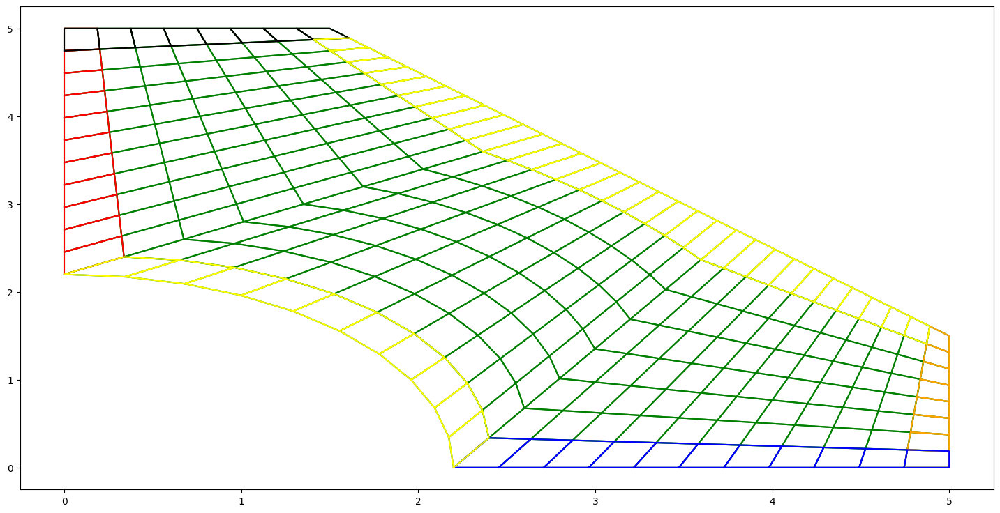

100%|██████████| 594/594 [00:00<00:00, 137396.82it/s]


max_dU:  2.986440014738995
max_dU:  0.9870130846012066
max_dU:  0.4566494814838658
max_dU:  0.08955018650027156
max_dU:  0.01398154763014628


100%|██████████| 256/256 [00:00<00:00, 957.68it/s]


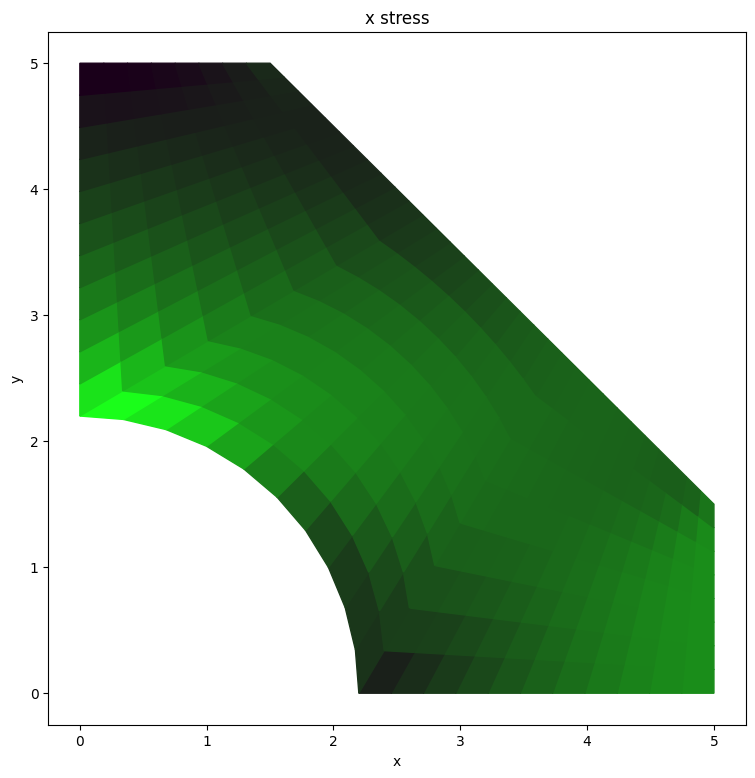

100%|██████████| 256/256 [00:00<00:00, 691.86it/s]


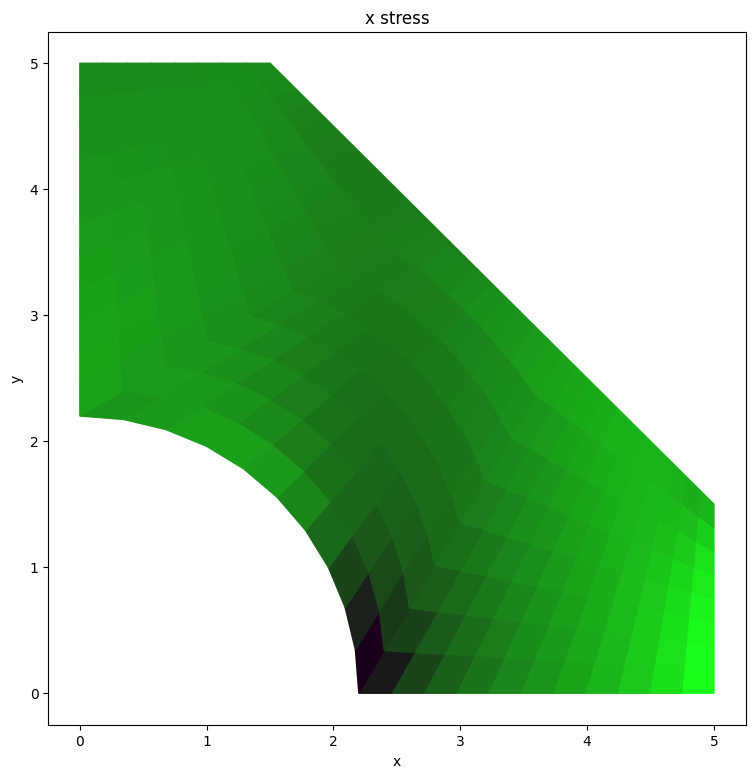

100%|██████████| 256/256 [00:00<00:00, 932.71it/s]


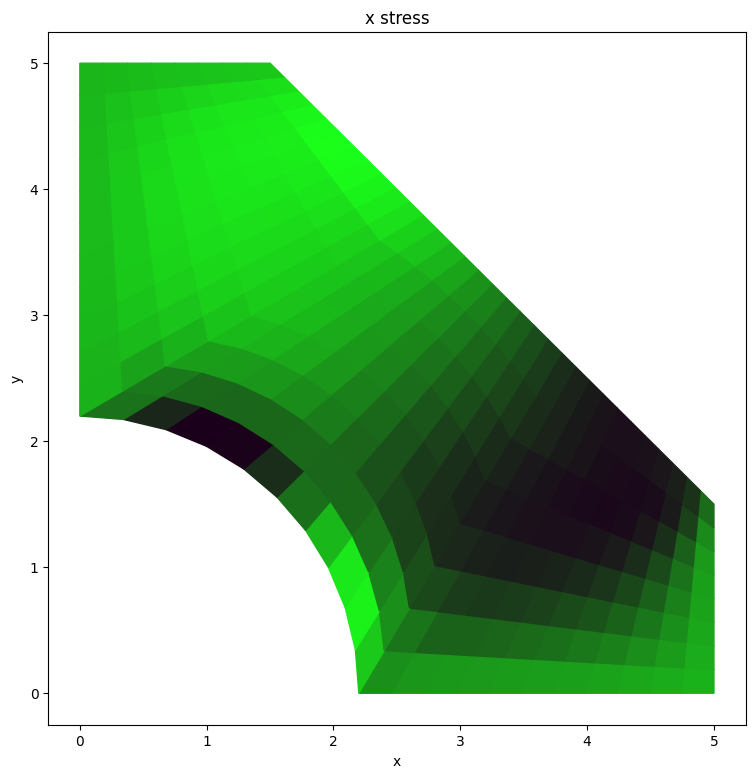

num iters: 540


100%|██████████| 500/500 [00:00<00:00, 665.50it/s]


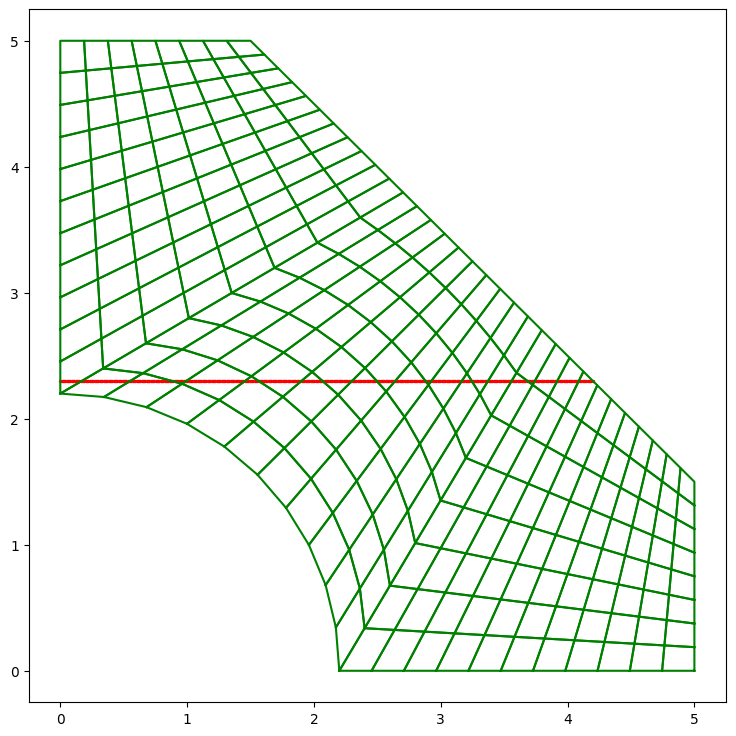

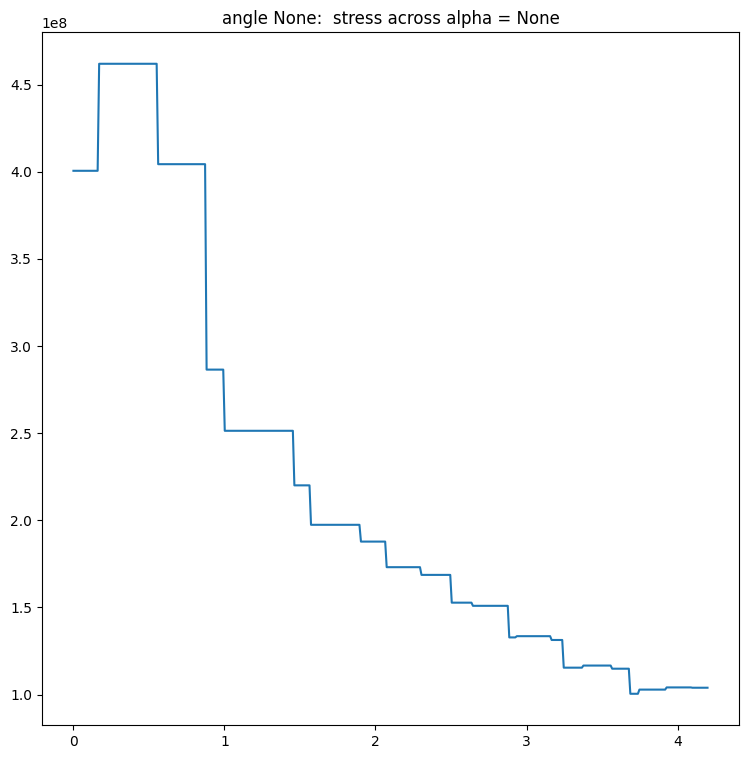

100%|██████████| 500/500 [00:00<00:00, 552.41it/s]


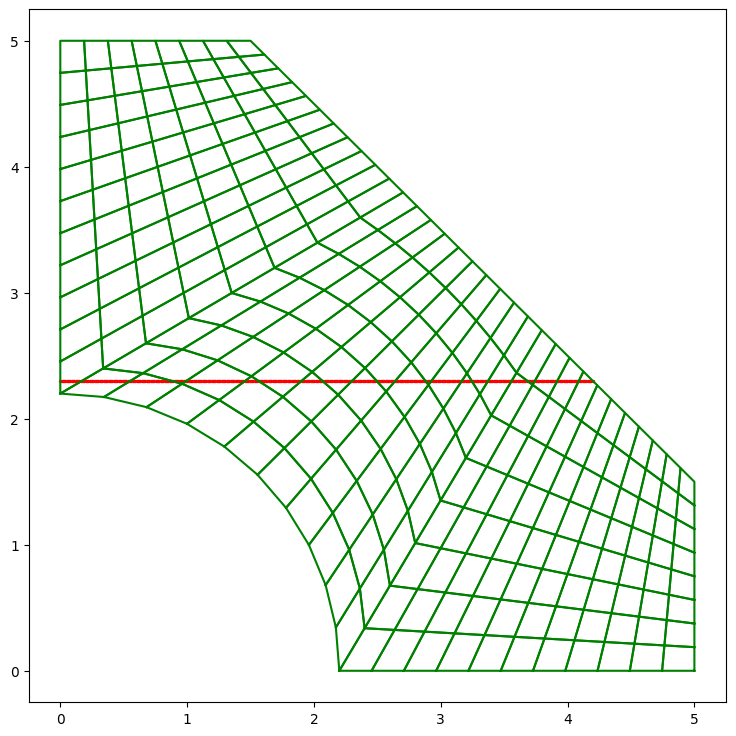

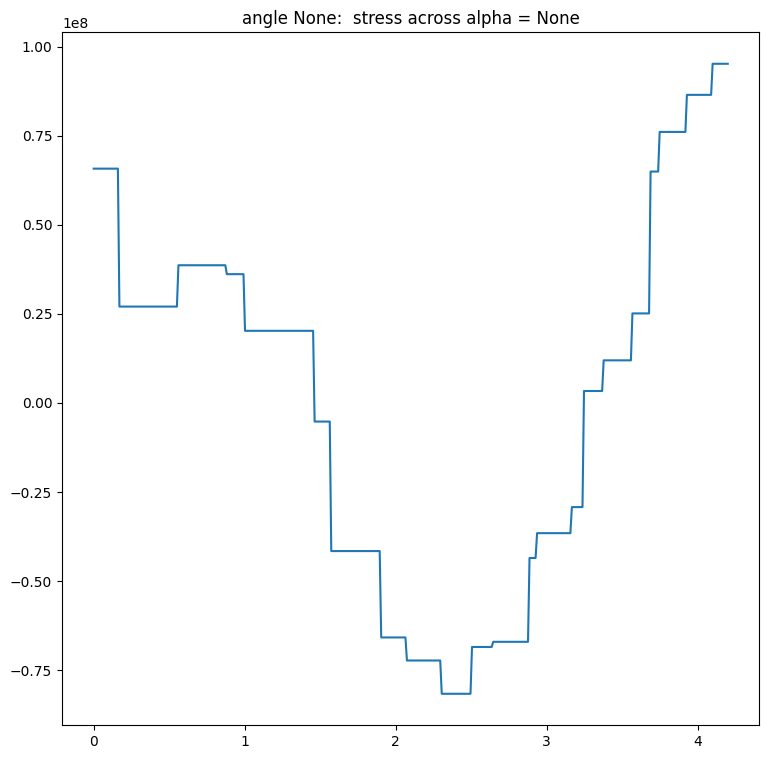

100%|██████████| 500/500 [00:01<00:00, 434.28it/s]


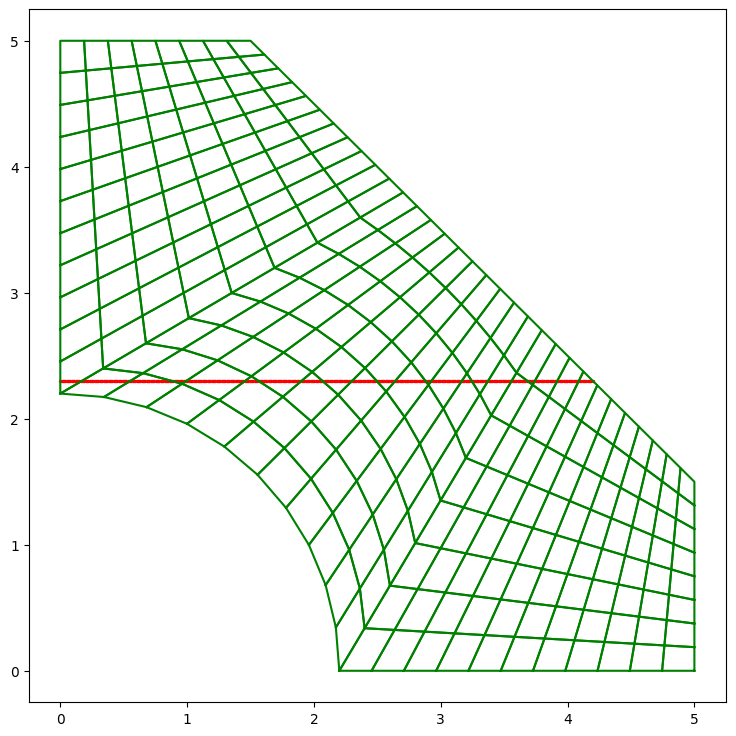

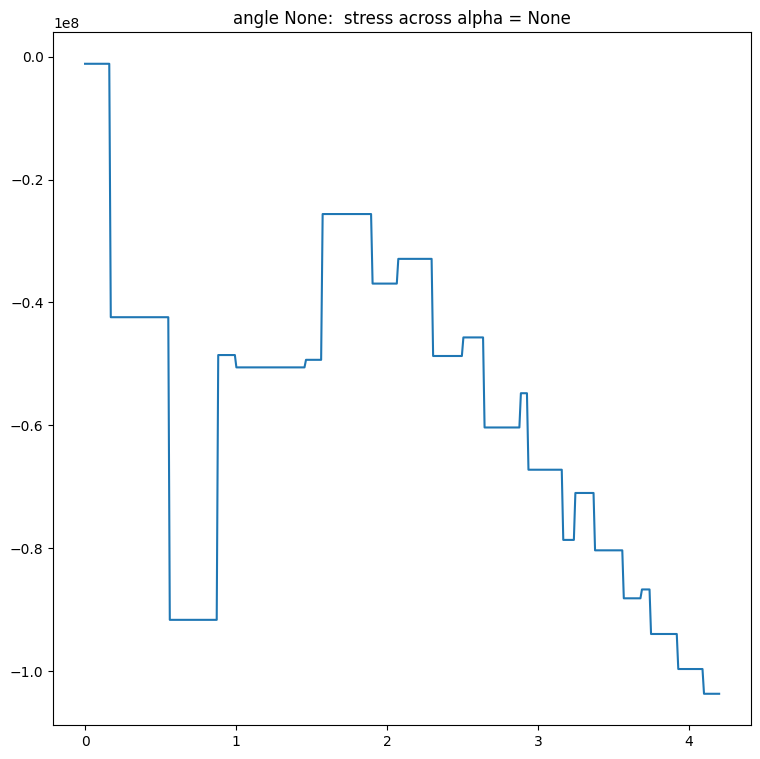

100%|██████████| 500/500 [00:02<00:00, 225.57it/s]


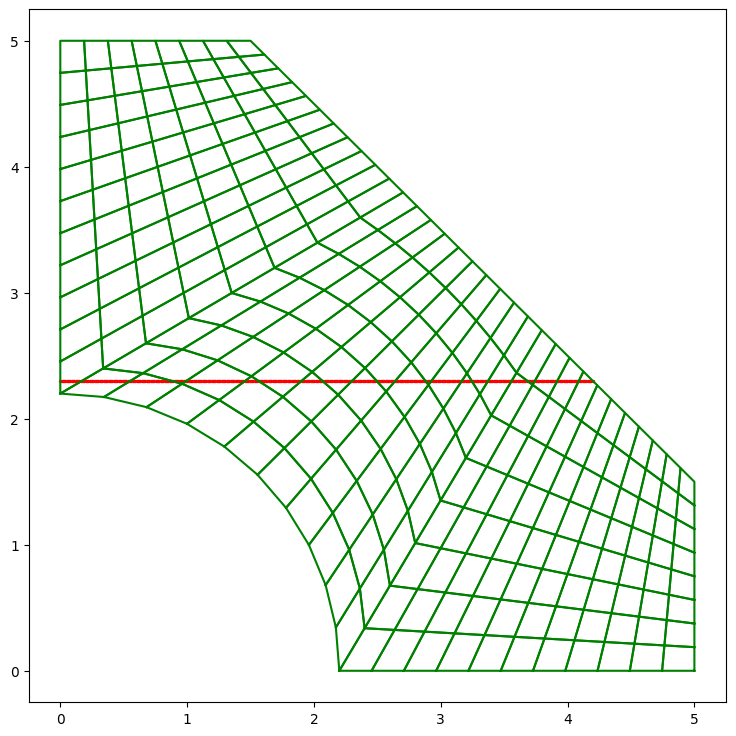

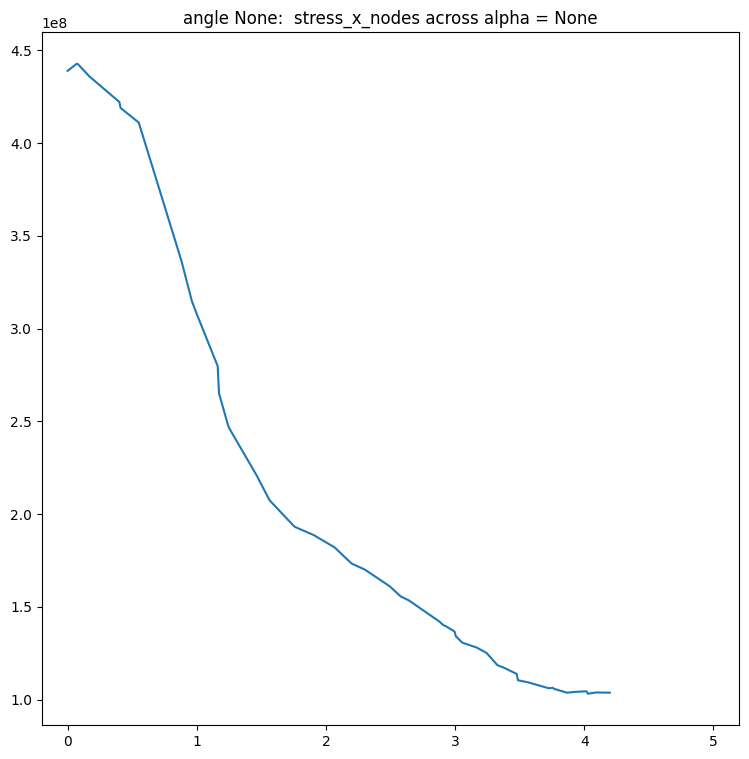

100%|██████████| 500/500 [00:01<00:00, 312.20it/s]


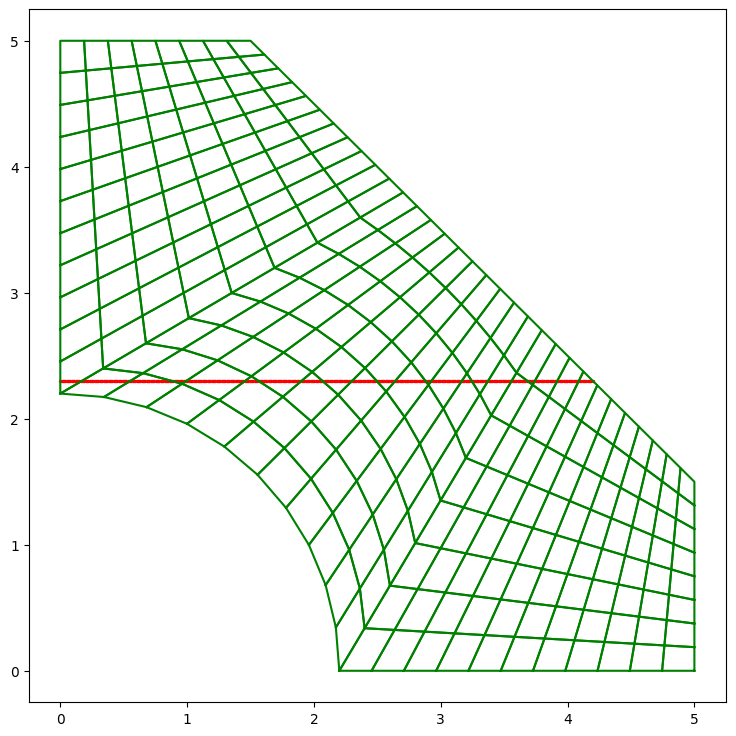

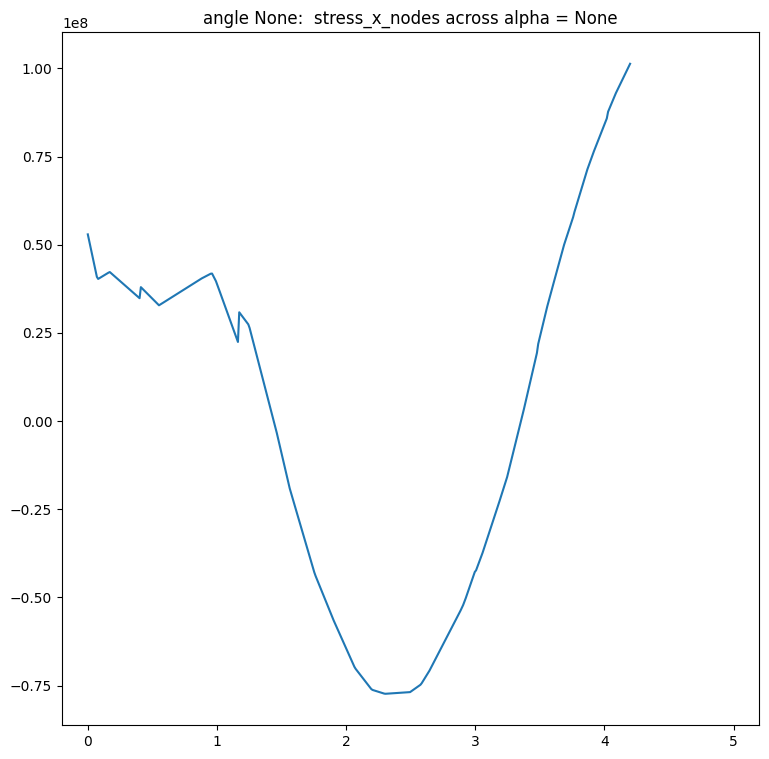

100%|██████████| 500/500 [00:01<00:00, 341.83it/s]


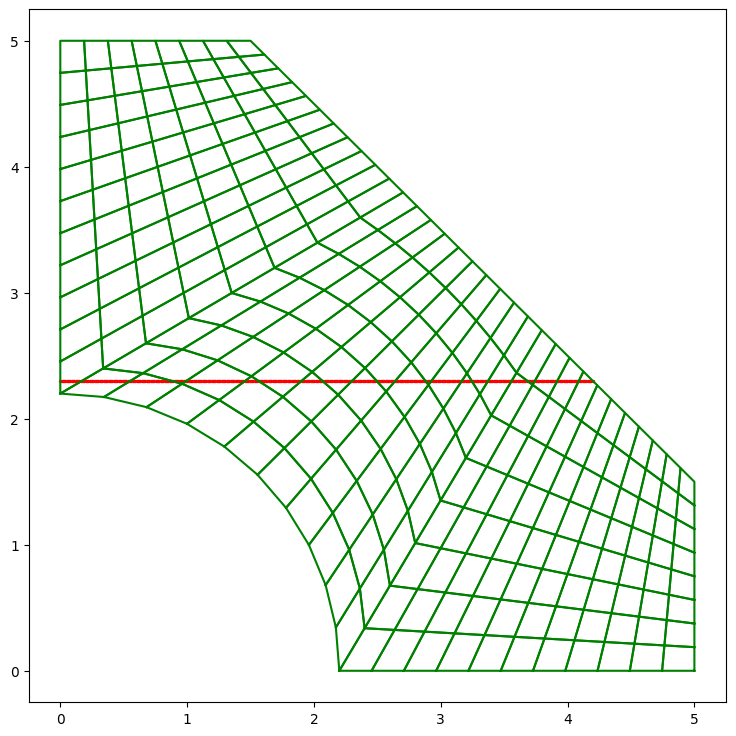

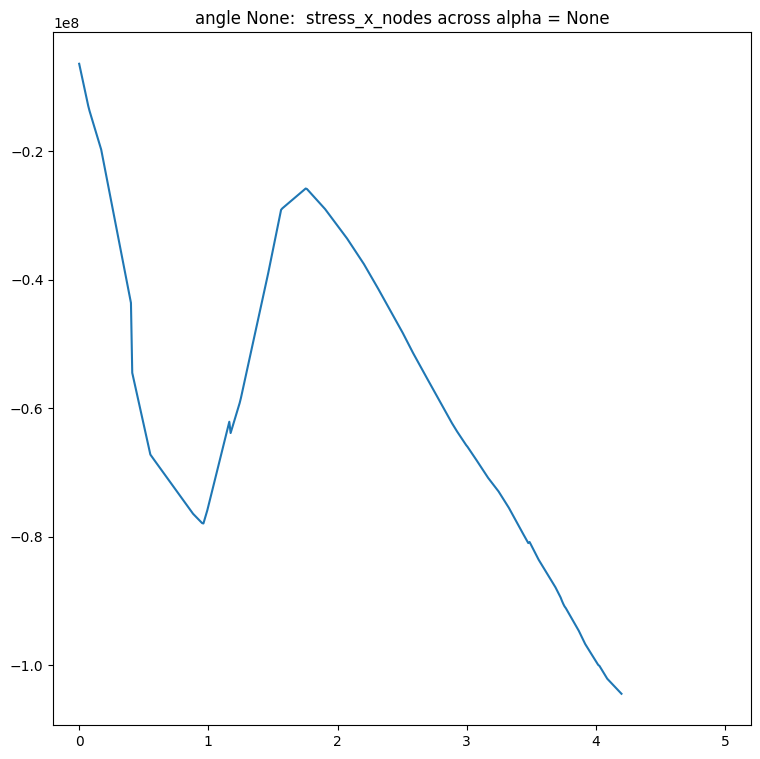

0.09375.k
num verts:  1105
num triags:  1024
100%|██████████| 82/82 [00:00<00:00, 37534.97it/s]


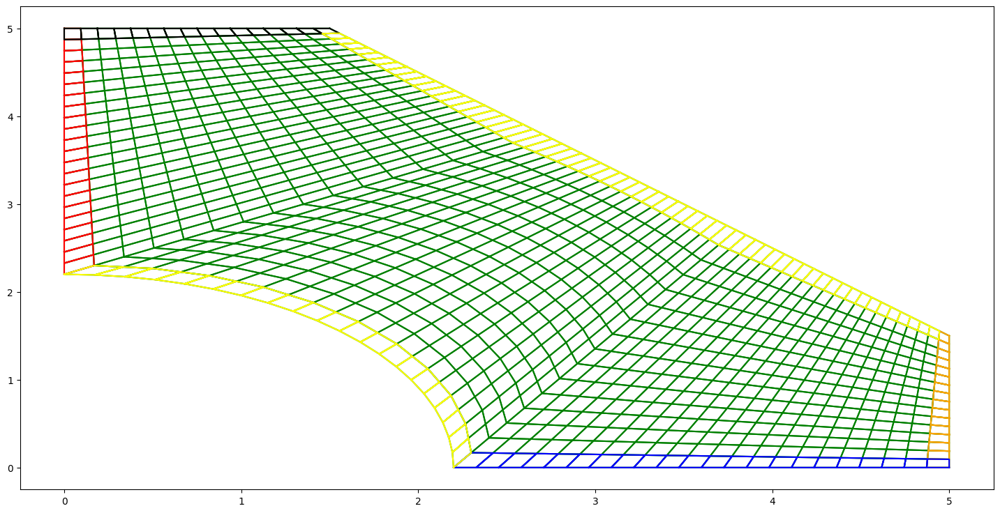

100%|██████████| 2210/2210 [00:00<00:00, 80476.92it/s]


max_dU:  4.136274481593468
max_dU:  2.7793441999434947
max_dU:  1.7461126831647584
max_dU:  1.065726135646999
max_dU:  0.6544689905337212
max_dU:  0.47729202840890955
max_dU:  0.2415563487518047
max_dU:  0.10081567640164611
max_dU:  0.05360454710596332
max_dU:  0.021272540408887264
max_dU:  0.010589294436409886


100%|██████████| 1024/1024 [00:01<00:00, 759.90it/s]


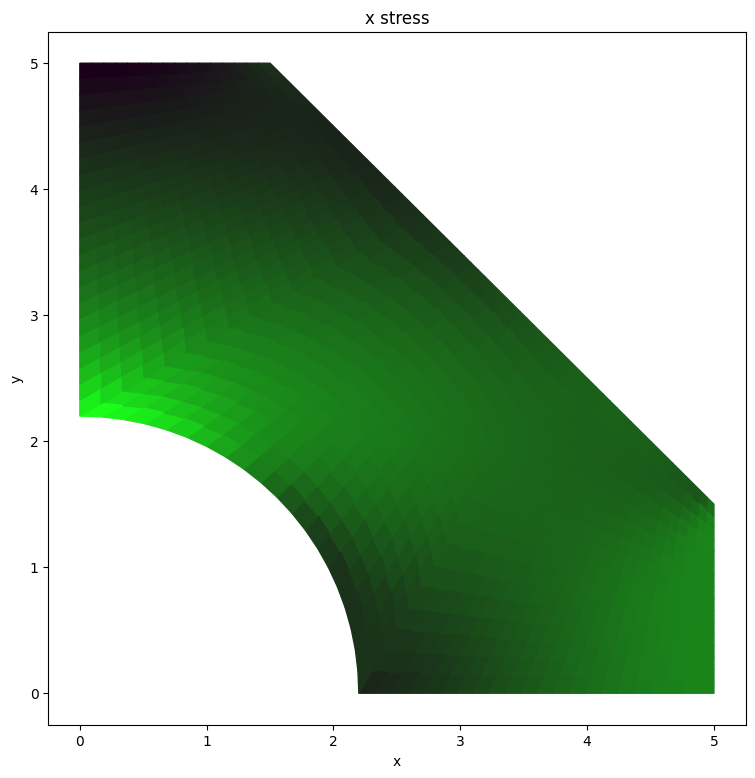

100%|██████████| 1024/1024 [00:01<00:00, 803.53it/s]


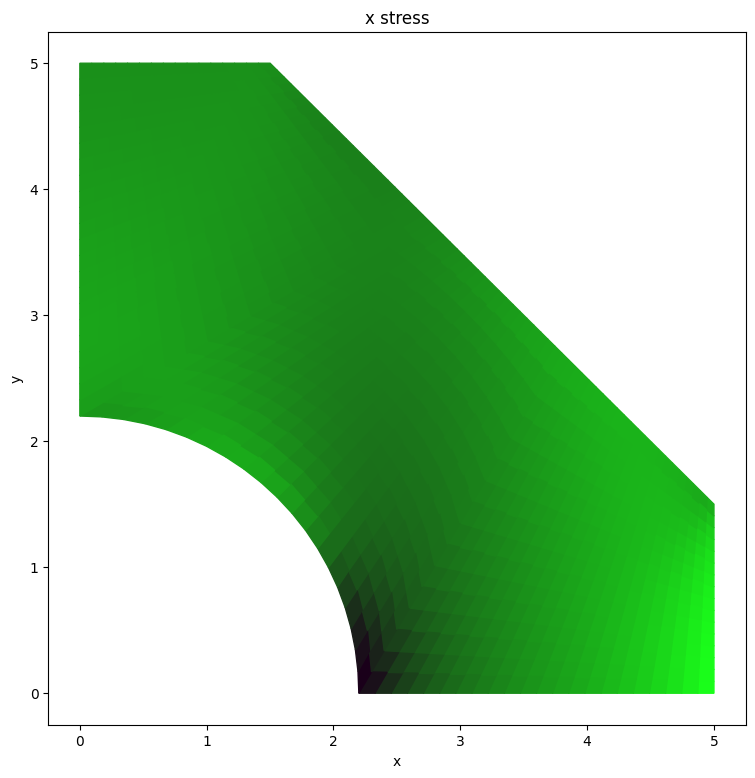

100%|██████████| 1024/1024 [00:01<00:00, 802.62it/s]


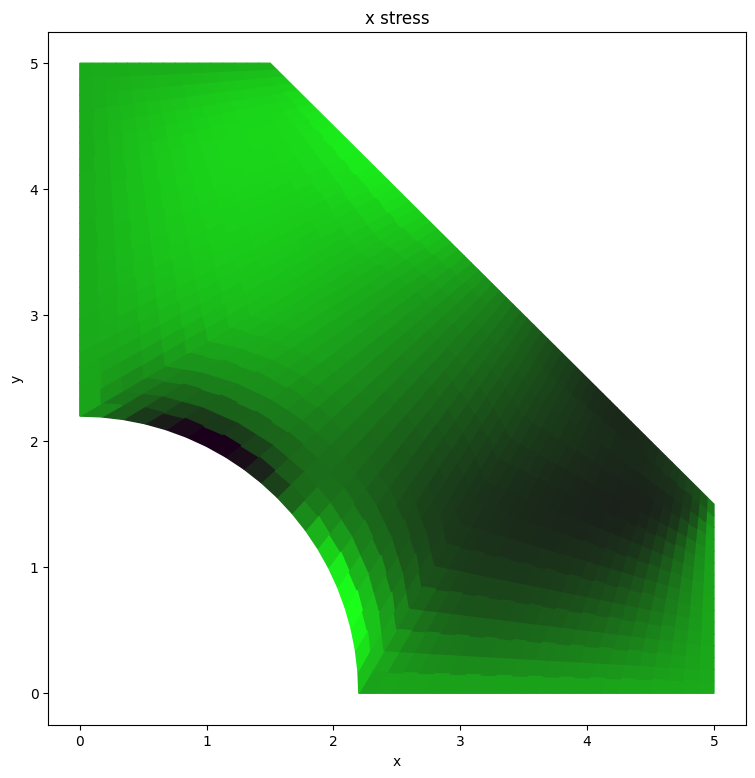

num iters: 1134


100%|██████████| 500/500 [00:00<00:00, 1039.87it/s]


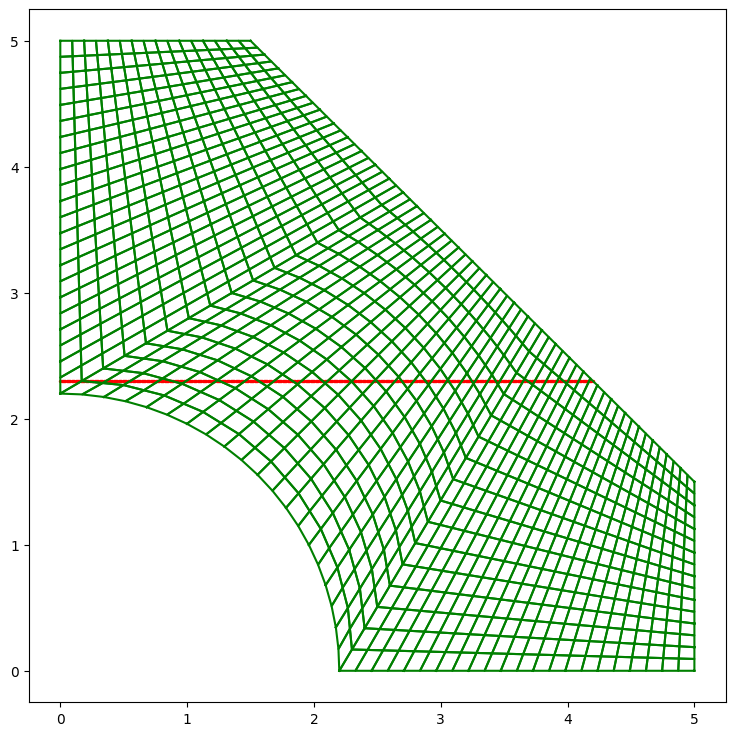

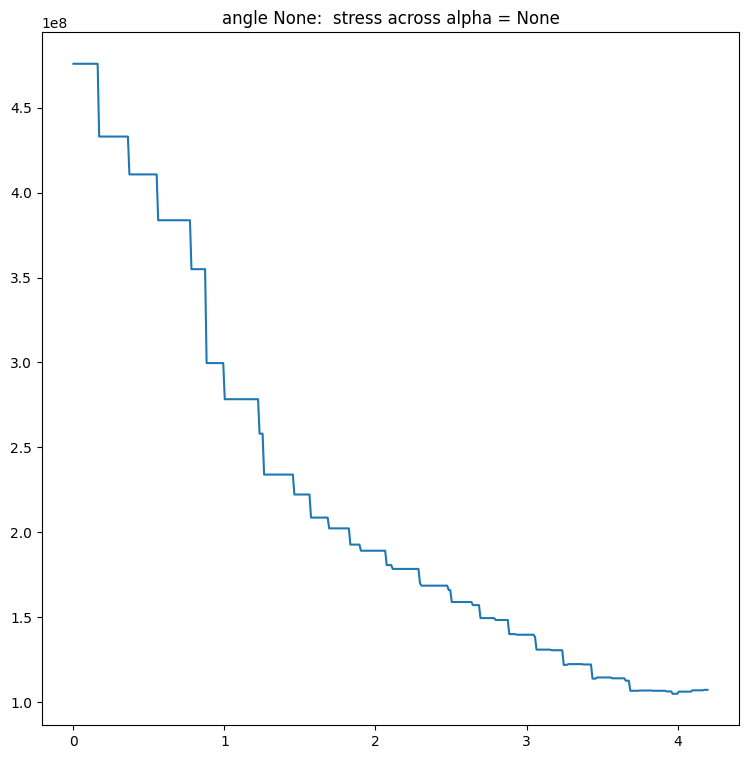

100%|██████████| 500/500 [00:00<00:00, 1054.45it/s]


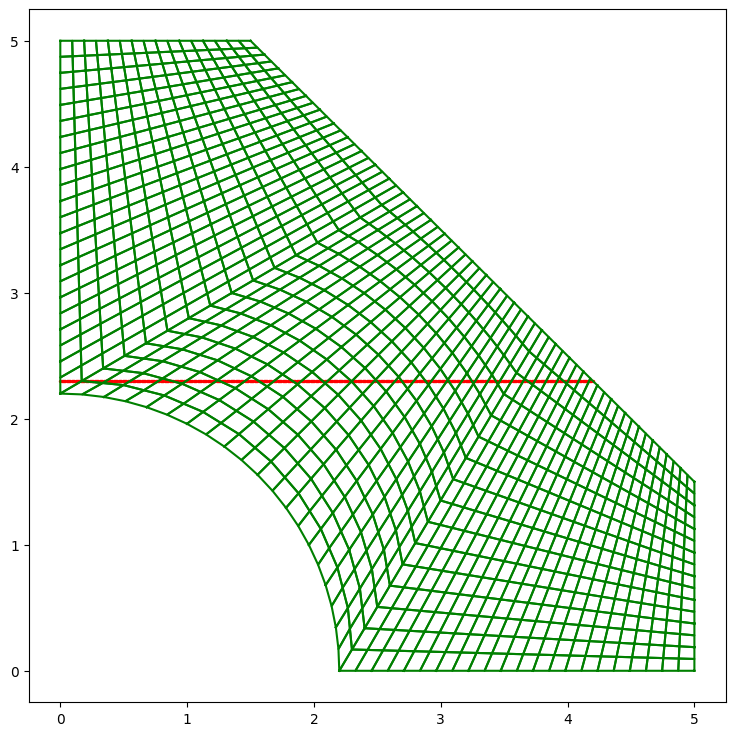

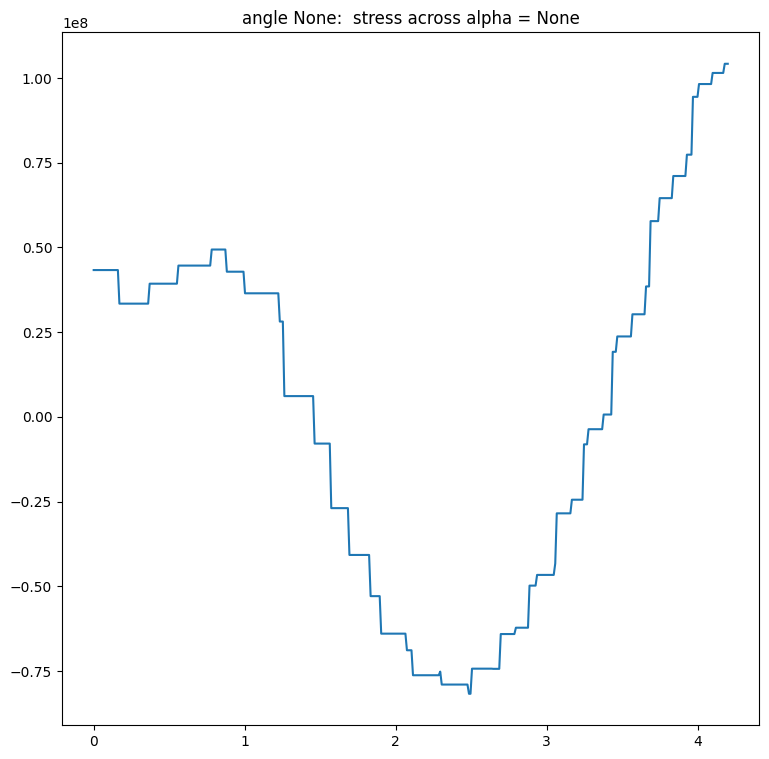

100%|██████████| 500/500 [00:00<00:00, 788.81it/s]


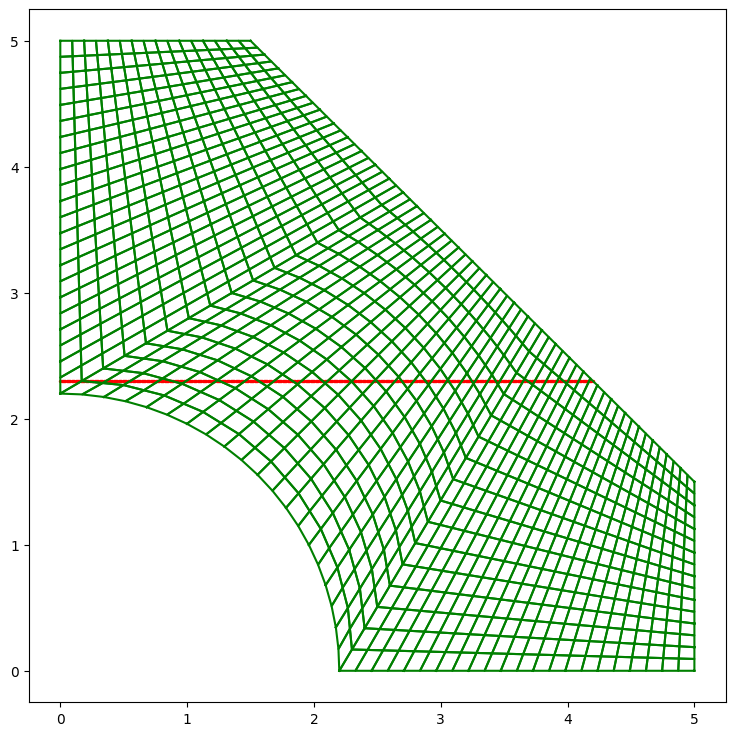

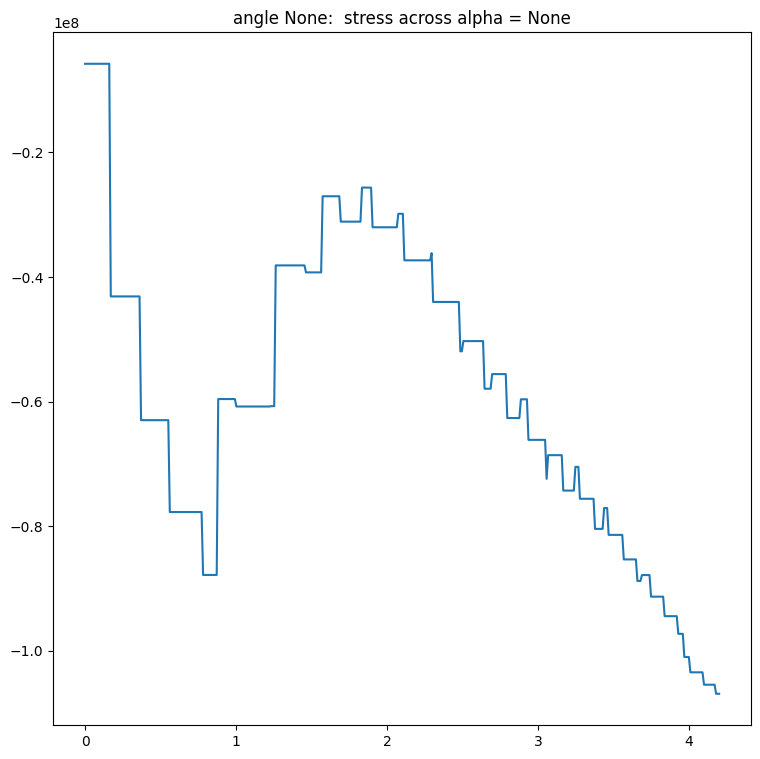

100%|██████████| 500/500 [00:00<00:00, 512.86it/s]


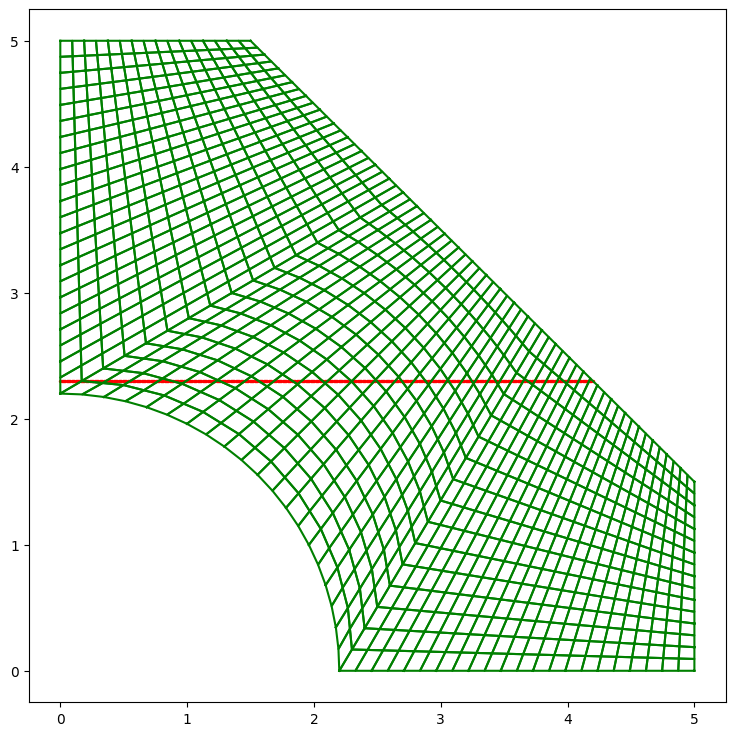

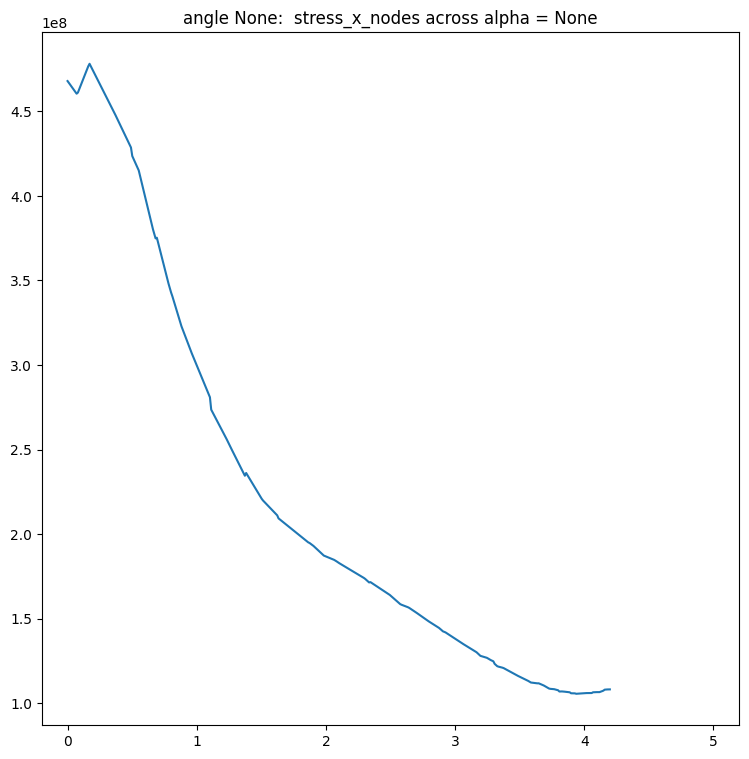

100%|██████████| 500/500 [00:00<00:00, 704.89it/s]


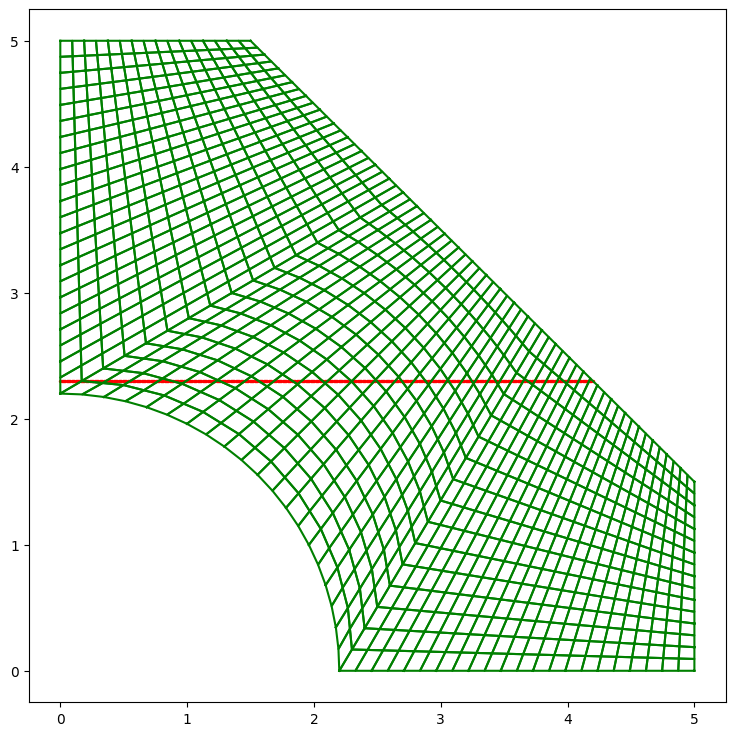

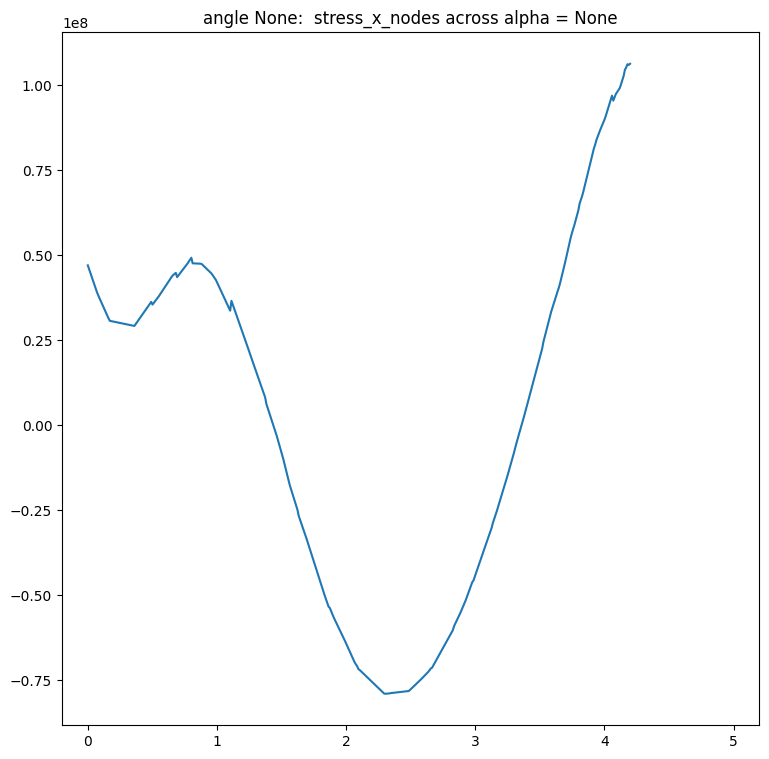

100%|██████████| 500/500 [00:00<00:00, 735.73it/s]


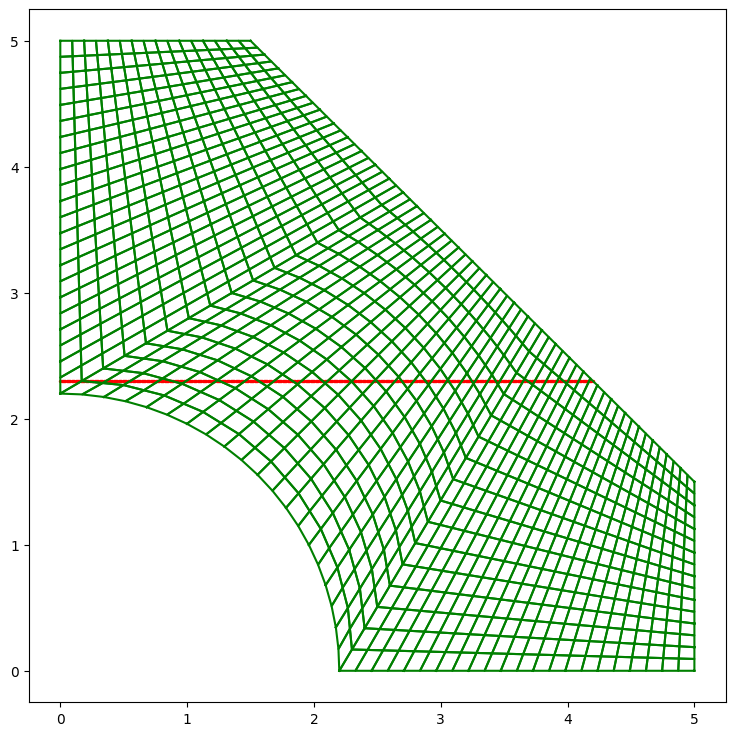

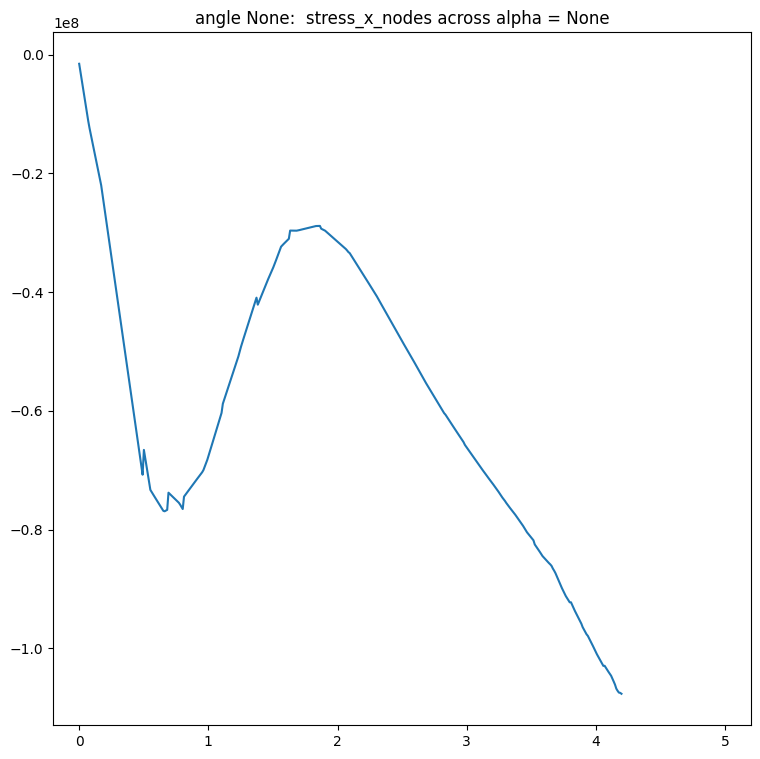

0.046875.k
num verts:  4257
num triags:  4096
100%|██████████| 166/166 [00:00<00:00, 117570.83it/s]


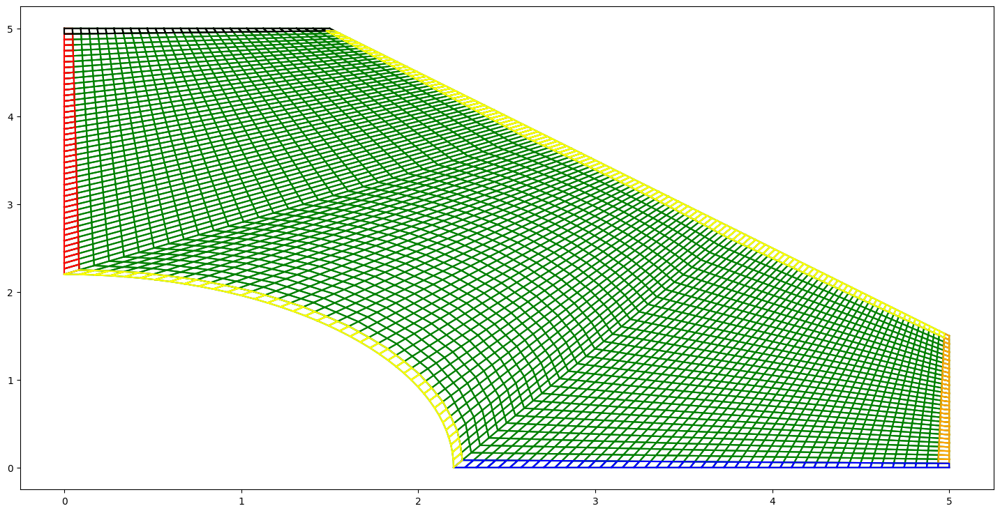

100%|██████████| 8514/8514 [00:00<00:00, 155550.30it/s]


max_dU:  4.56981368943623
max_dU:  4.190214715168359
max_dU:  3.326400684748074
max_dU:  2.928119604021275
max_dU:  2.3890159852995225
max_dU:  1.7952995363248356
max_dU:  1.2659134183157275
max_dU:  1.0463970934360576
max_dU:  0.7161590625660229
max_dU:  0.6405419324067013
max_dU:  0.6242643024519021
max_dU:  0.49771737335648775
max_dU:  0.3674859132744281
max_dU:  0.2587748152235202
max_dU:  0.1539290411771491
max_dU:  0.10762533570129829
max_dU:  0.07654261056633307
max_dU:  0.06047945524981762
max_dU:  0.03513238793726088
max_dU:  0.02378082716553363
max_dU:  0.018760977864903355
max_dU:  0.011934558484415983


100%|██████████| 4096/4096 [00:06<00:00, 595.21it/s]


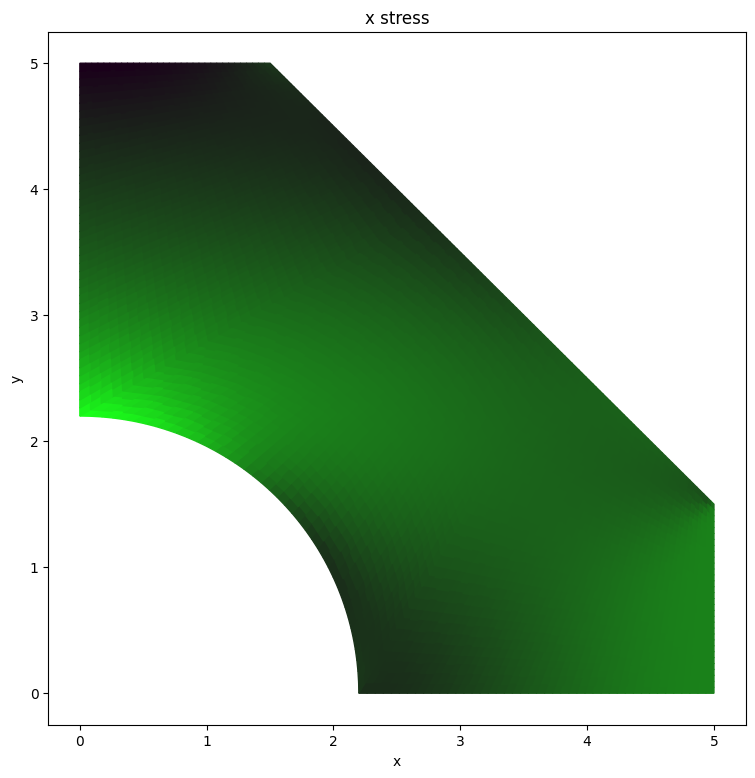

100%|██████████| 4096/4096 [00:06<00:00, 608.30it/s]


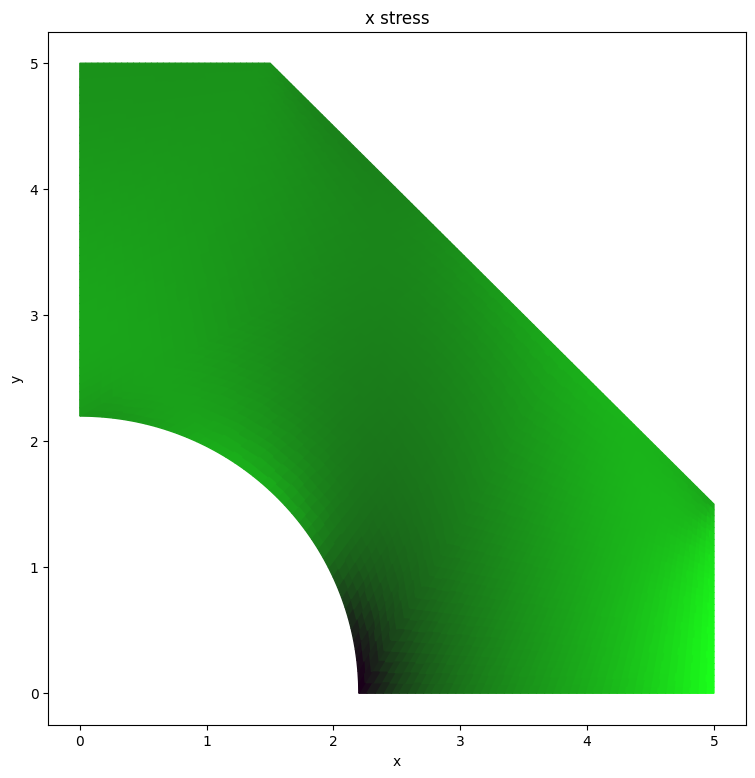

100%|██████████| 4096/4096 [00:05<00:00, 744.91it/s]


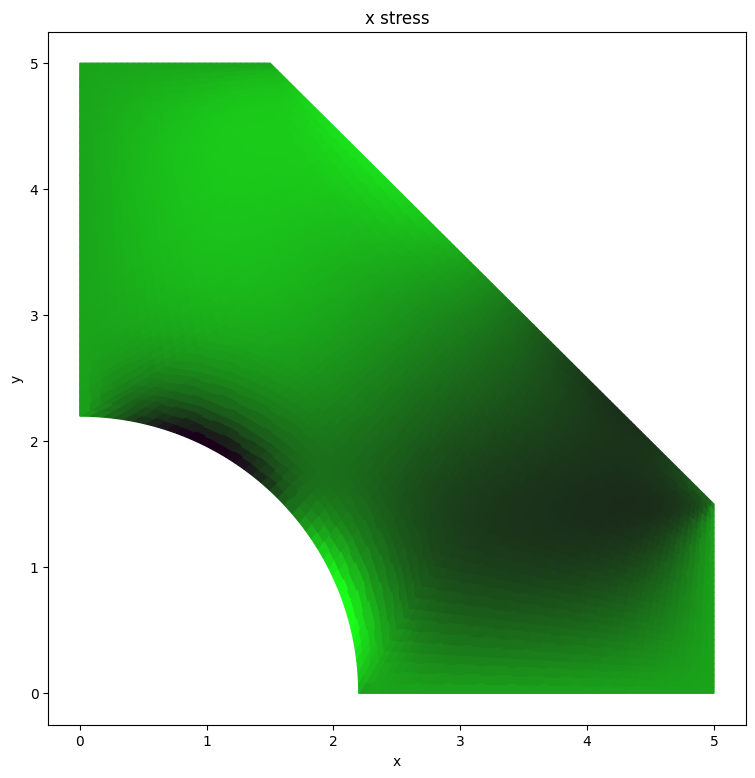

num iters: 2294


100%|██████████| 500/500 [00:00<00:00, 637.26it/s]


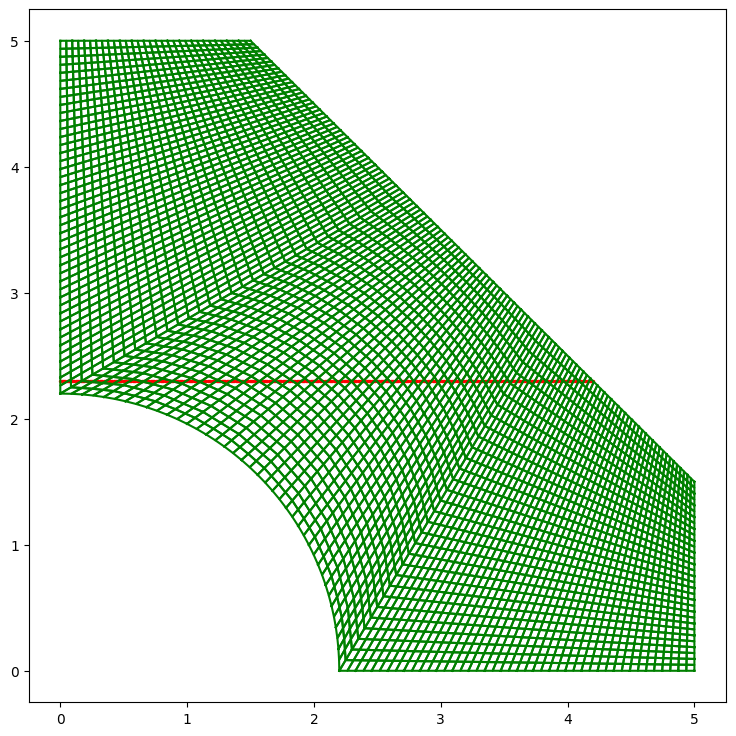

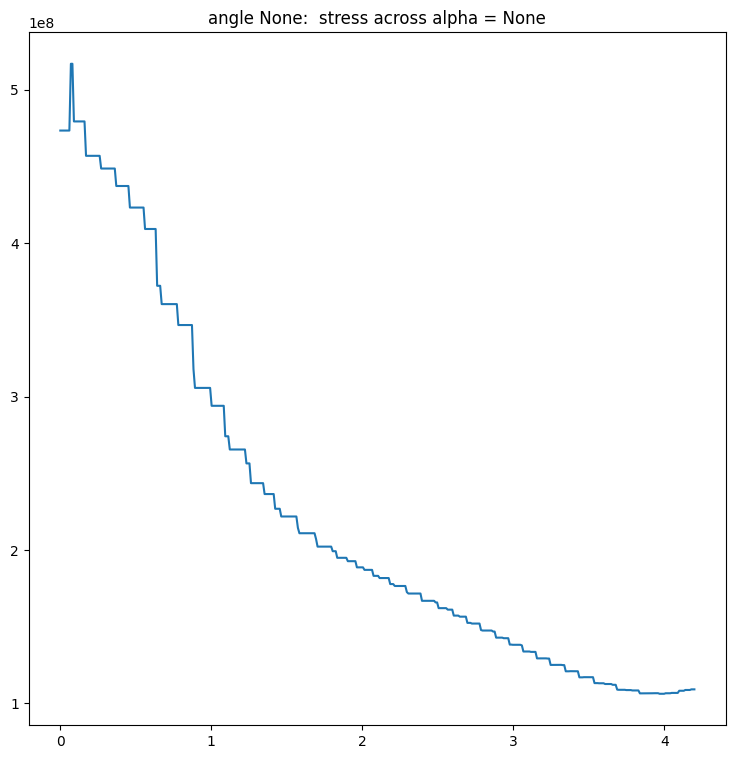

100%|██████████| 500/500 [00:00<00:00, 869.53it/s]


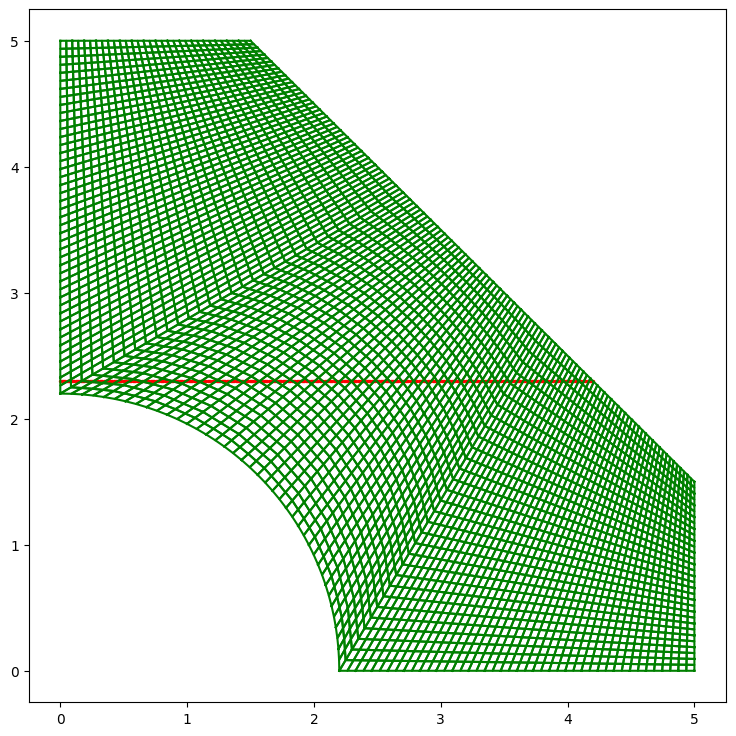

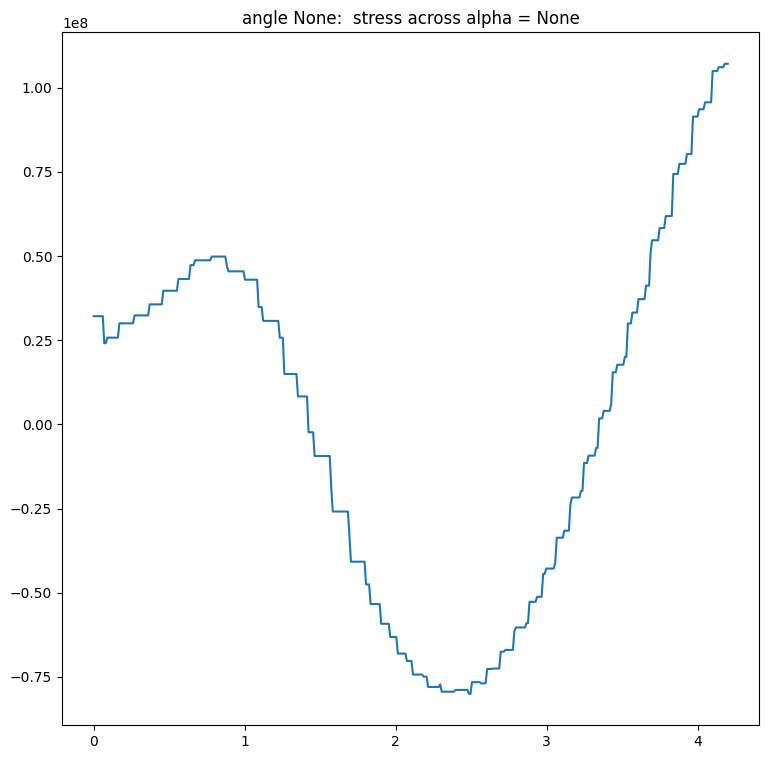

100%|██████████| 500/500 [00:00<00:00, 949.39it/s] 


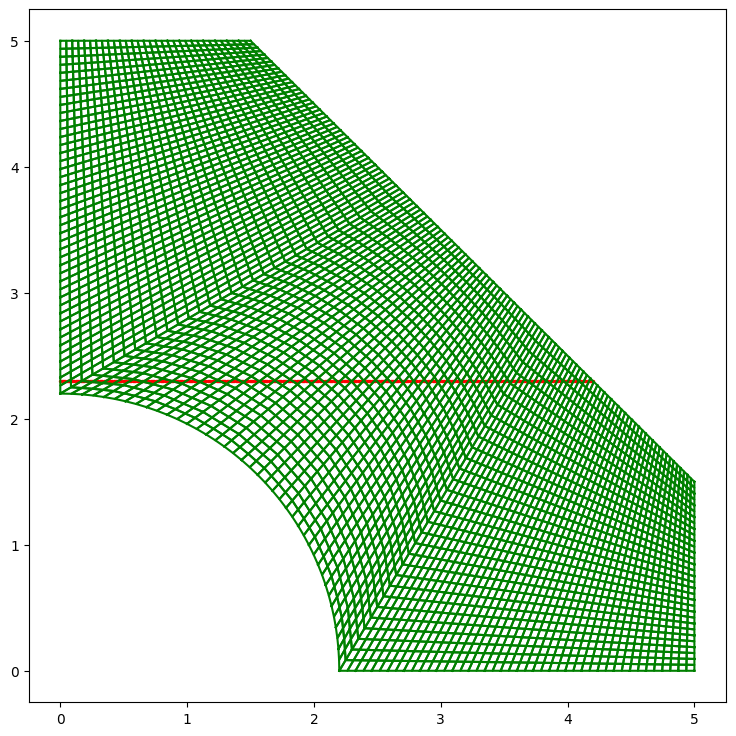

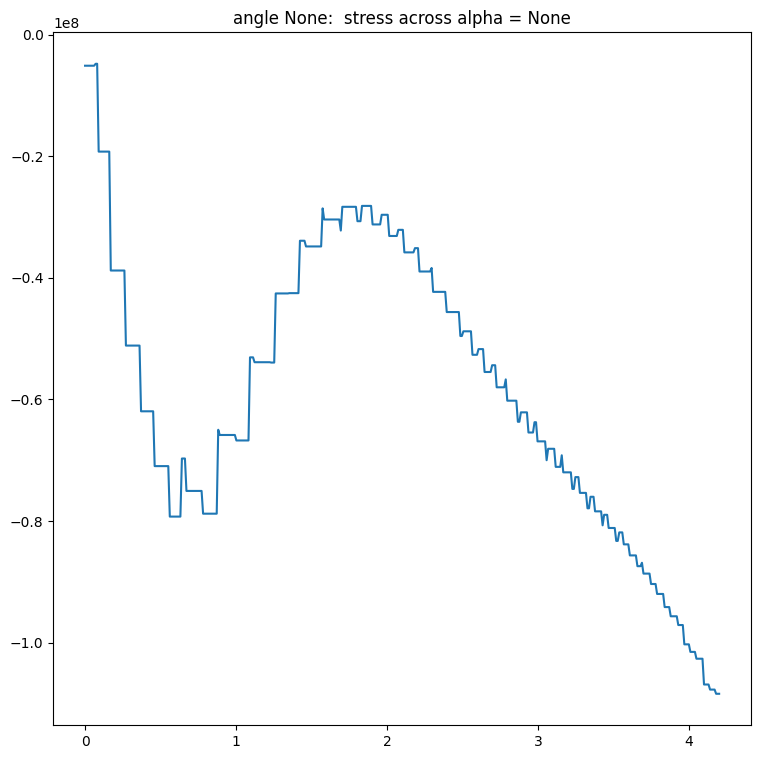

100%|██████████| 500/500 [00:00<00:00, 713.37it/s]


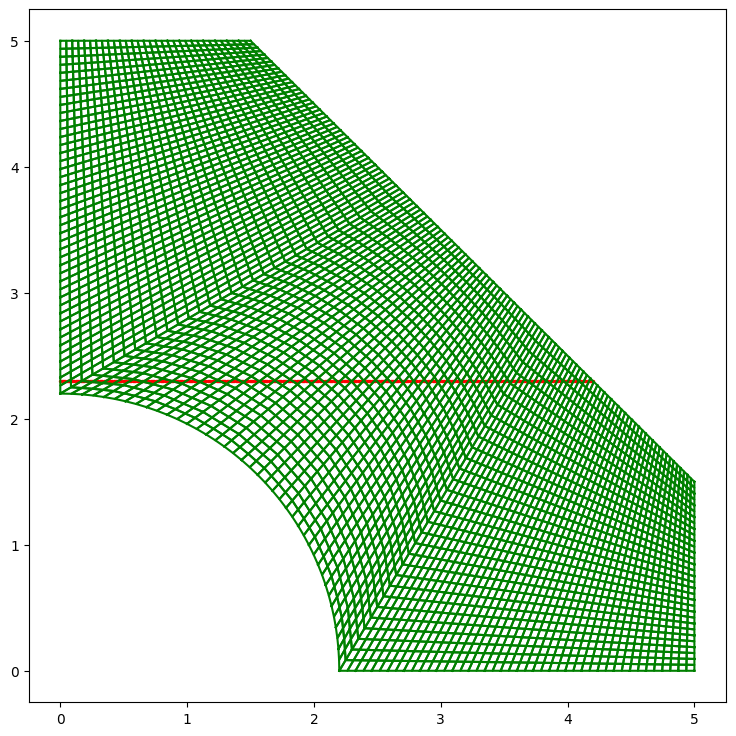

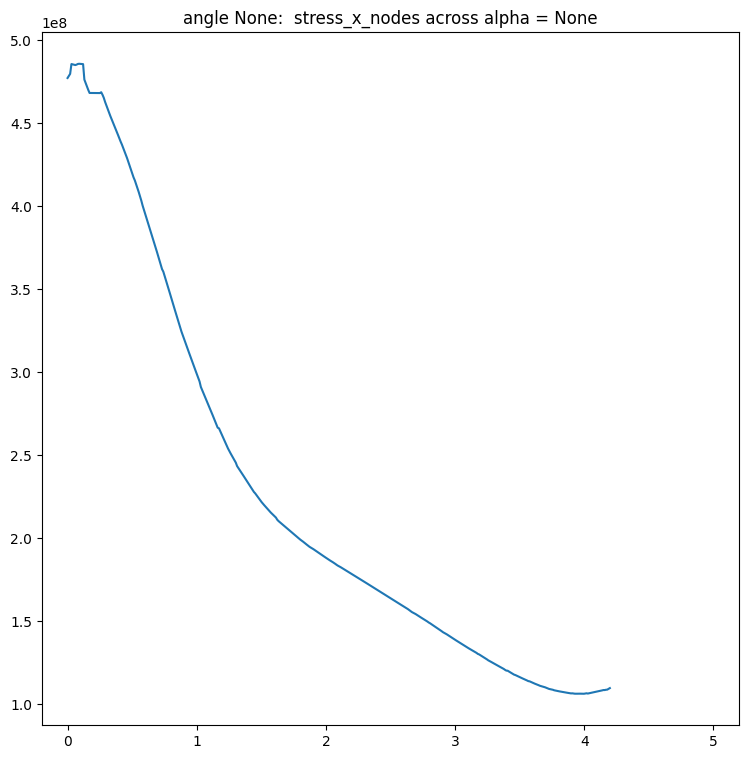

100%|██████████| 500/500 [00:00<00:00, 586.88it/s]


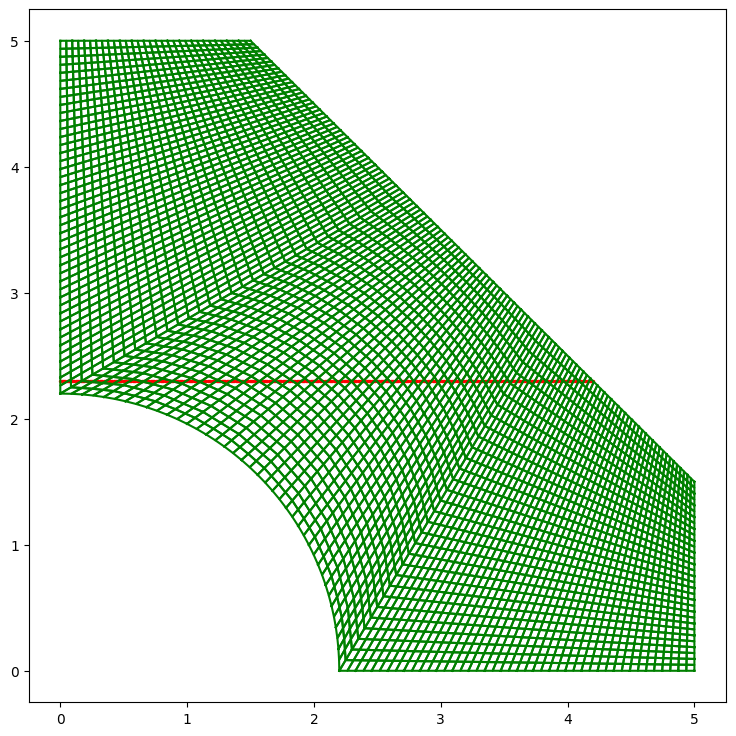

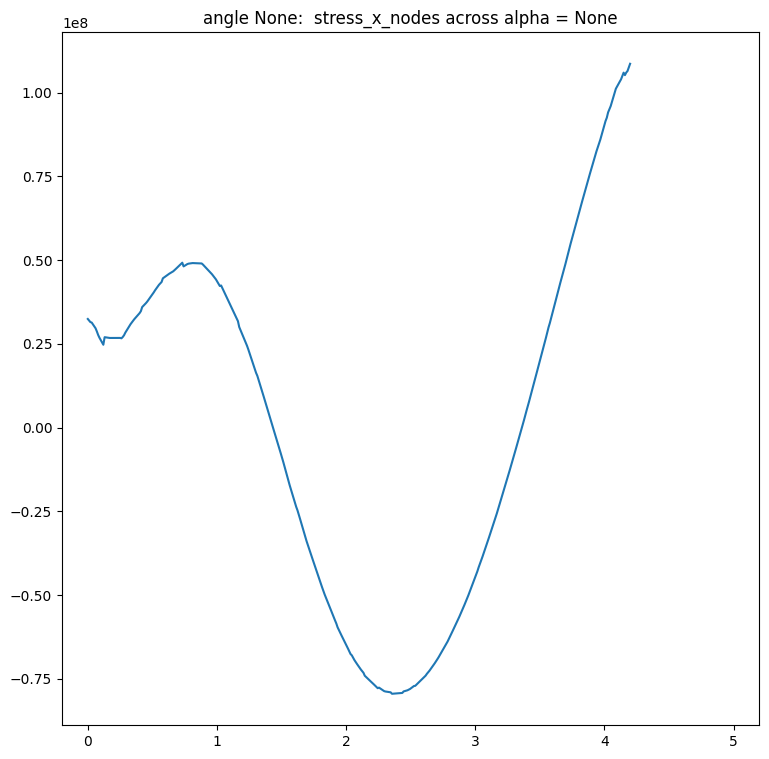

100%|██████████| 500/500 [00:00<00:00, 695.23it/s]


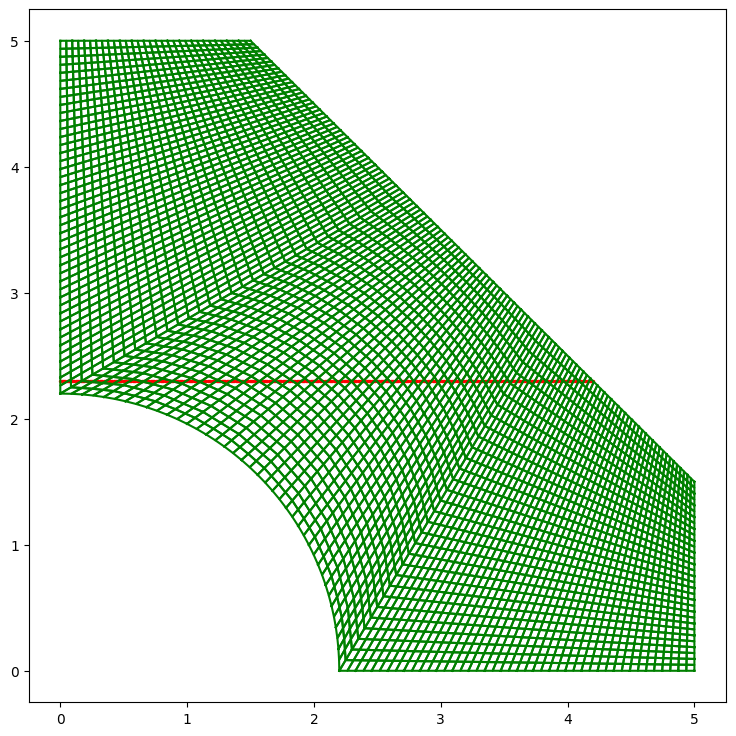

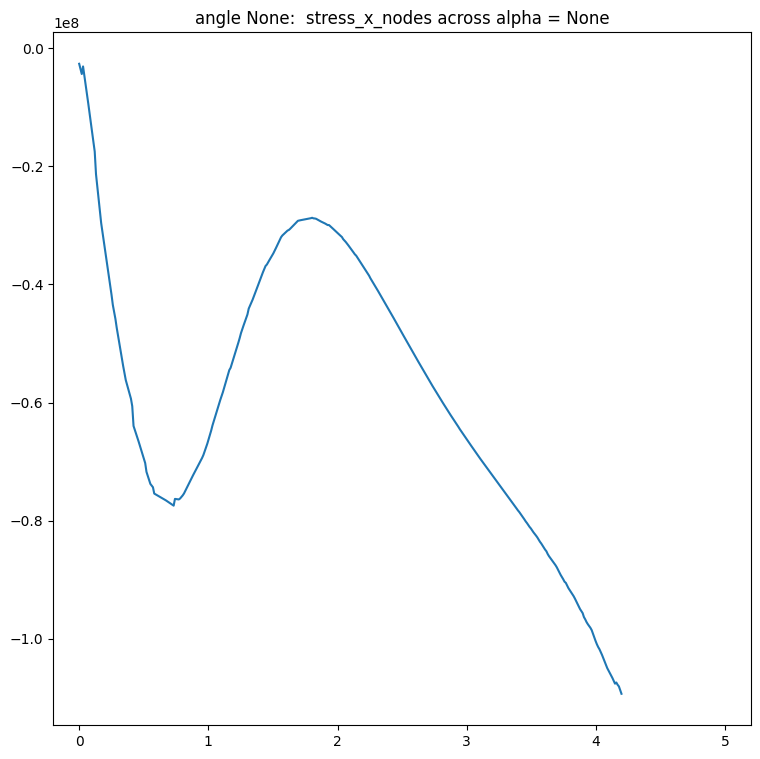

0.0234375.k
num verts:  16705
num triags:  16384
100%|██████████| 334/334 [00:00<00:00, 62792.36it/s]


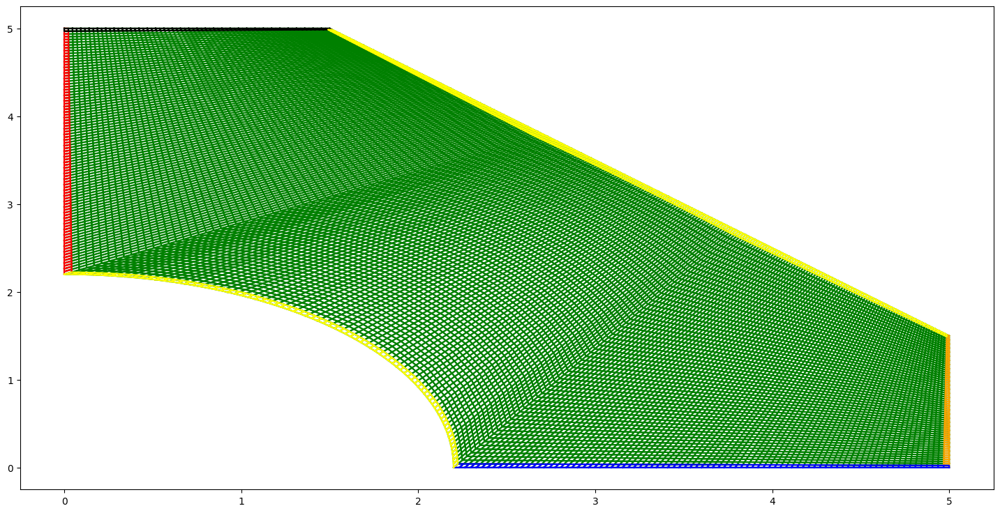

100%|██████████| 33410/33410 [00:00<00:00, 124538.70it/s]


max_dU:  5.601796050741569
max_dU:  4.950885115996037
max_dU:  5.913498705078085
max_dU:  4.158926698797762
max_dU:  4.7529565429398914
max_dU:  3.44342389779953
max_dU:  2.972075840704448
max_dU:  3.099442754084485
max_dU:  2.2150766814318477
max_dU:  2.002885546310475
max_dU:  1.7205837266768225
max_dU:  1.7302598249003738
max_dU:  1.5814449326669113
max_dU:  1.298117632537169
max_dU:  1.2945727363005435
max_dU:  1.0498187667998404
max_dU:  0.9251570543819425
max_dU:  0.7442437711662593
max_dU:  0.8331965593200767
max_dU:  0.6415183129274634
max_dU:  0.6438915925002843
max_dU:  0.6343305314129435
max_dU:  0.5463548916287774
max_dU:  0.49418910497022345
max_dU:  0.414419178537877
max_dU:  0.3797104758475402
max_dU:  0.31550199497196924
max_dU:  0.2528512129103368
max_dU:  0.1967623252435814
max_dU:  0.15369396028957363
max_dU:  0.13811913406609563
max_dU:  0.10700689224430054
max_dU:  0.08848478684891323
max_dU:  0.07803368814782334
max_dU:  0.0685740827130808
max_dU:  0.0576971057619

100%|██████████| 16384/16384 [00:24<00:00, 664.24it/s]


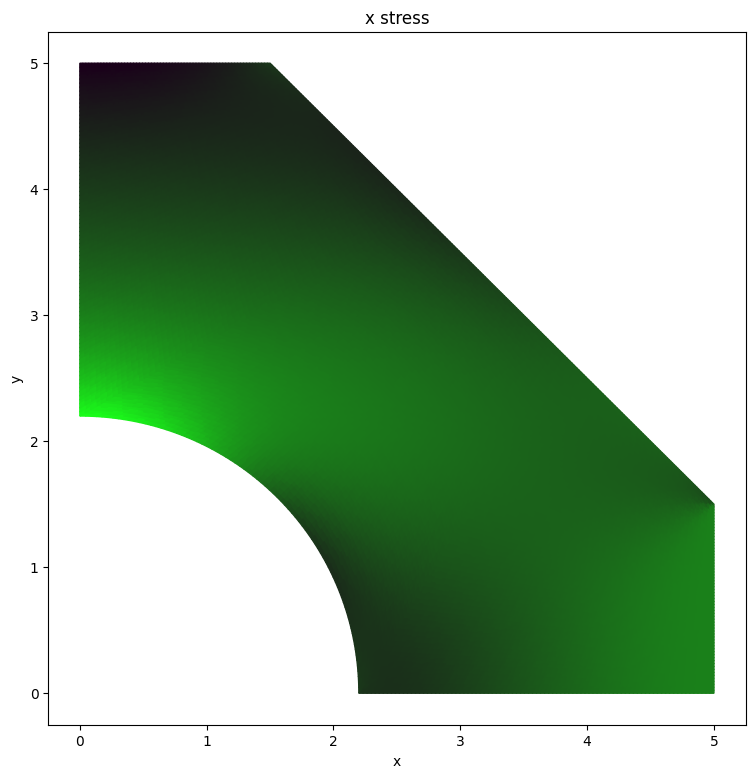

100%|██████████| 16384/16384 [00:23<00:00, 690.19it/s]


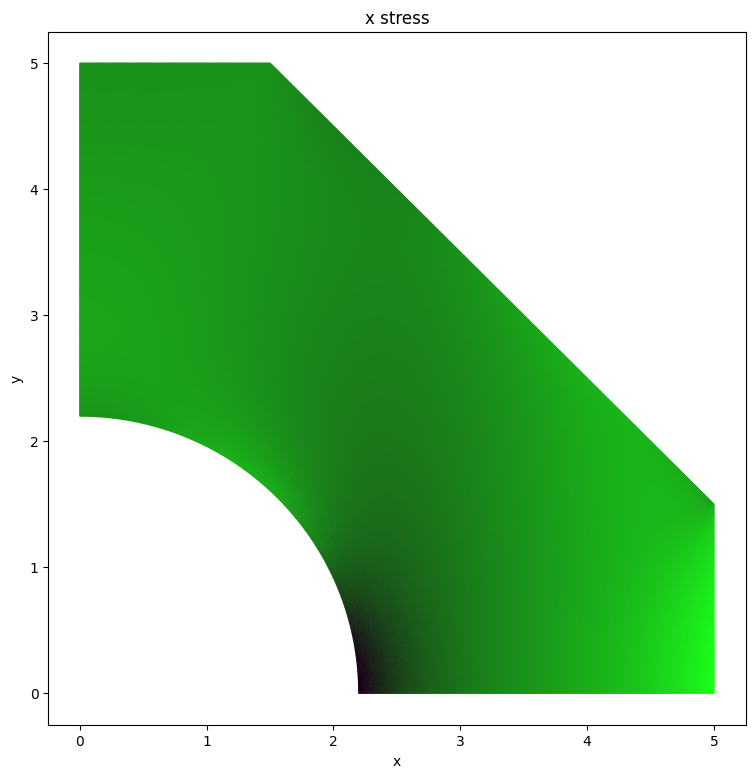

100%|██████████| 16384/16384 [00:23<00:00, 710.38it/s]


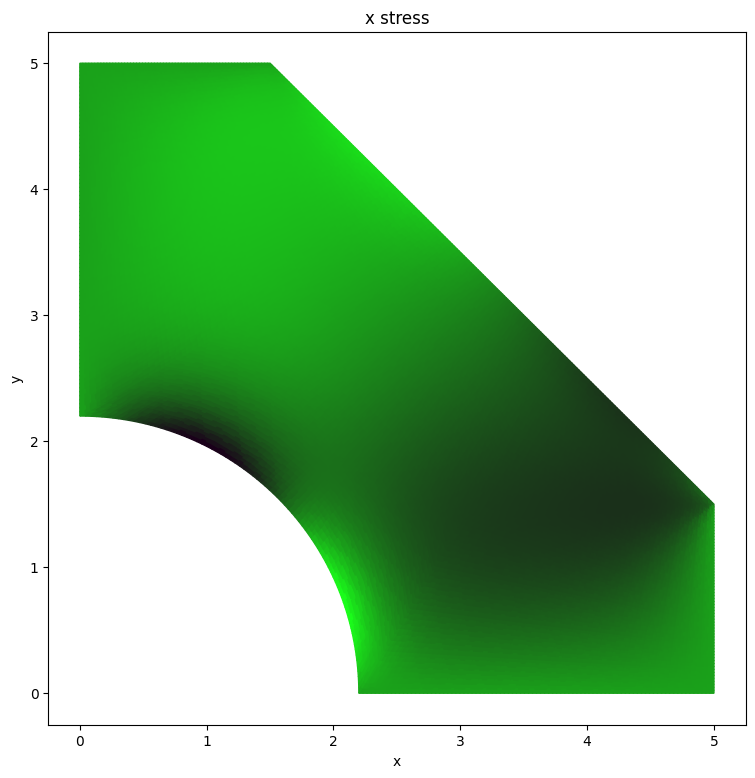

num iters: 4594


100%|██████████| 500/500 [00:00<00:00, 908.89it/s] 


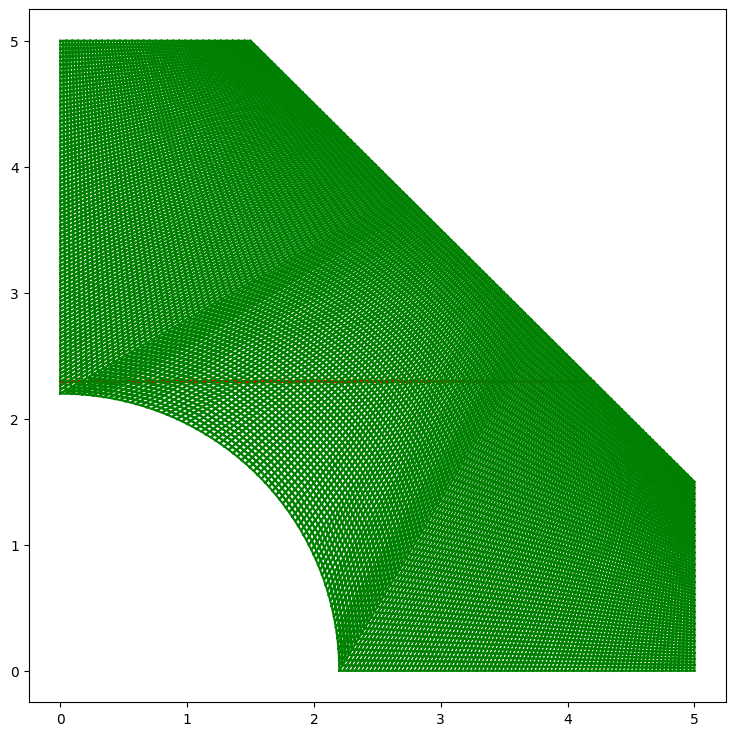

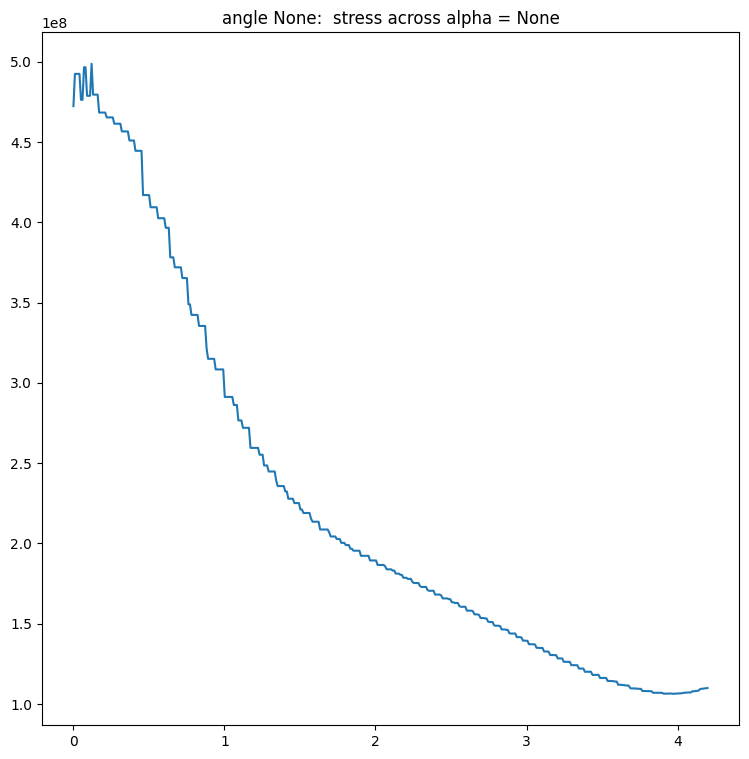

100%|██████████| 500/500 [00:00<00:00, 929.65it/s] 


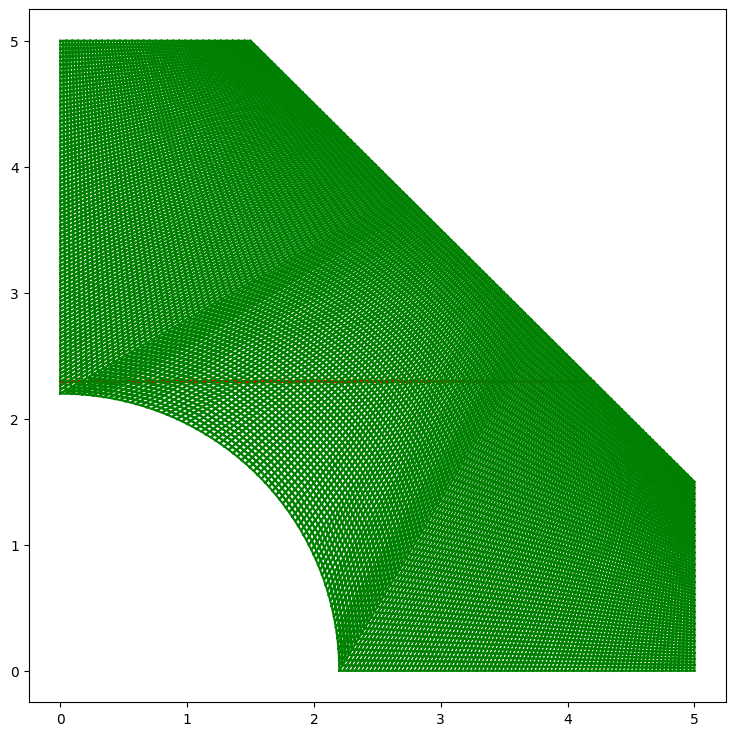

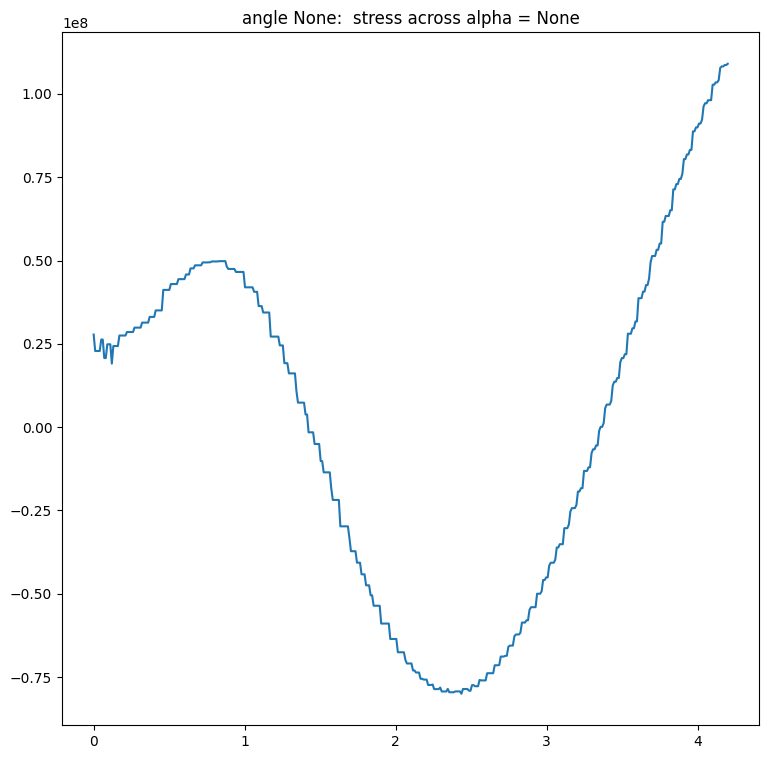

100%|██████████| 500/500 [00:00<00:00, 801.56it/s]


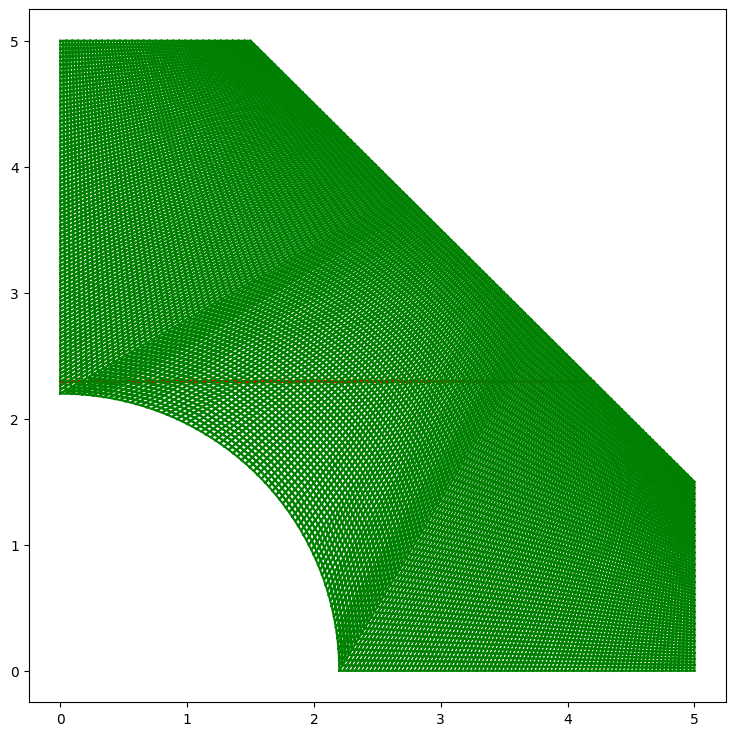

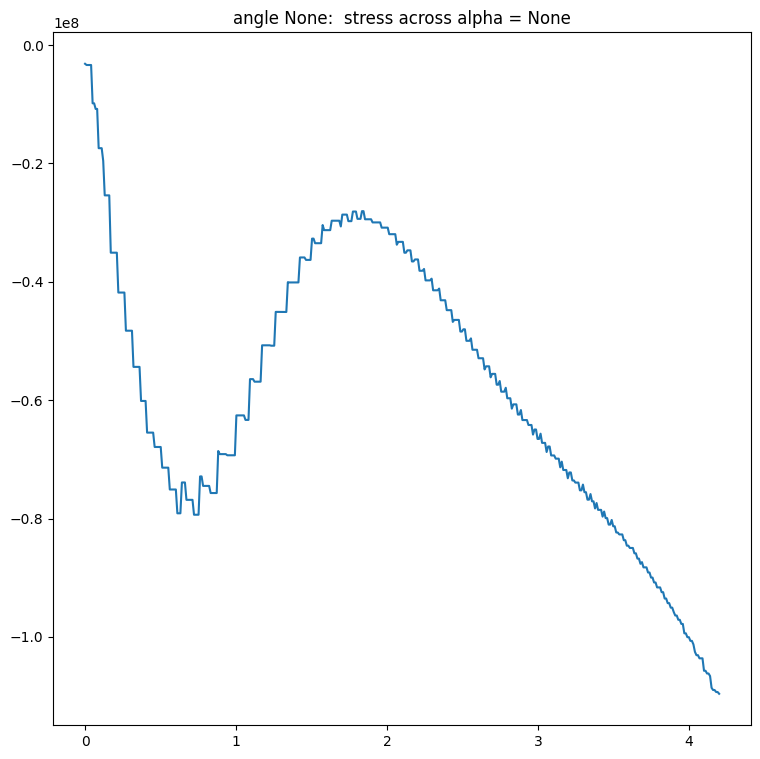

100%|██████████| 500/500 [00:00<00:00, 559.95it/s]


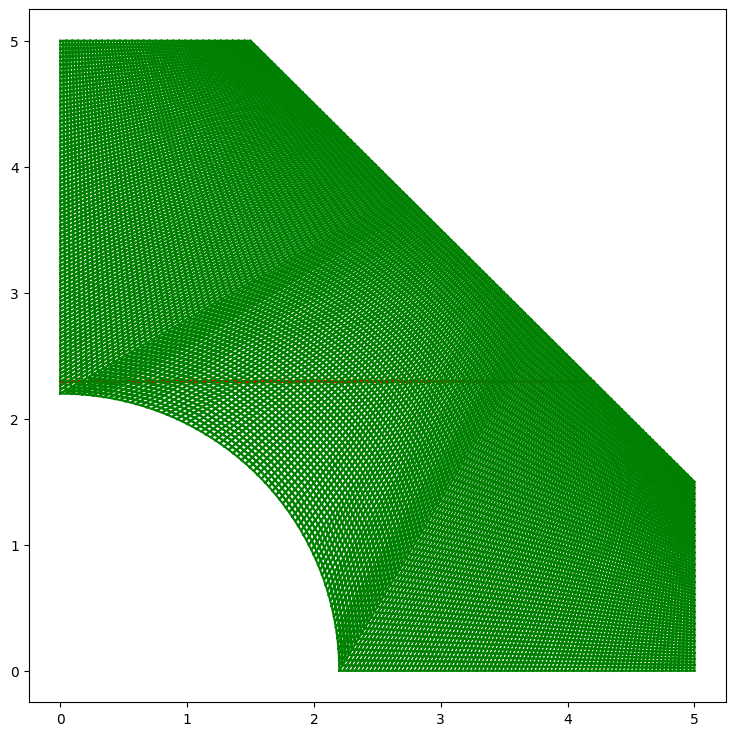

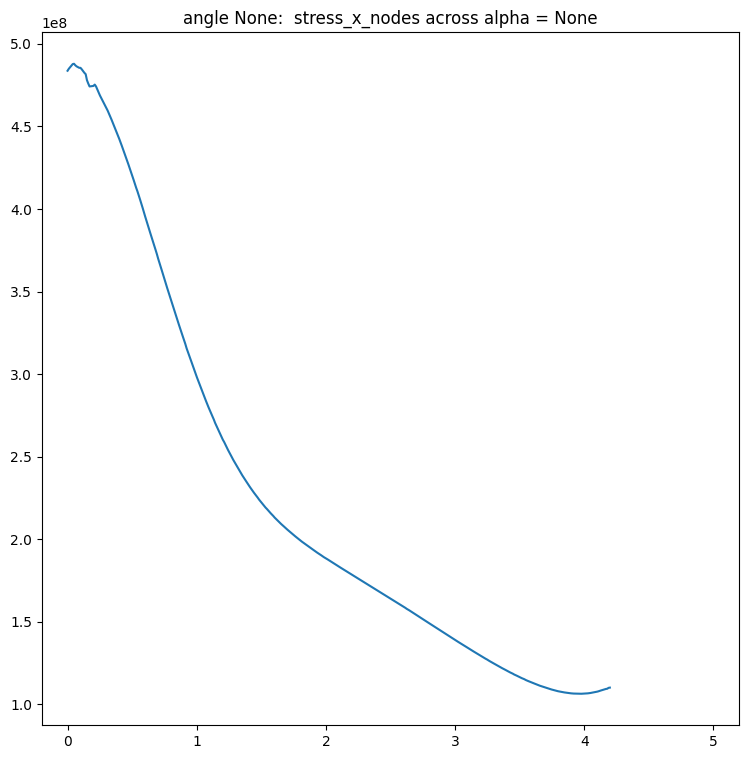

100%|██████████| 500/500 [00:00<00:00, 724.84it/s]


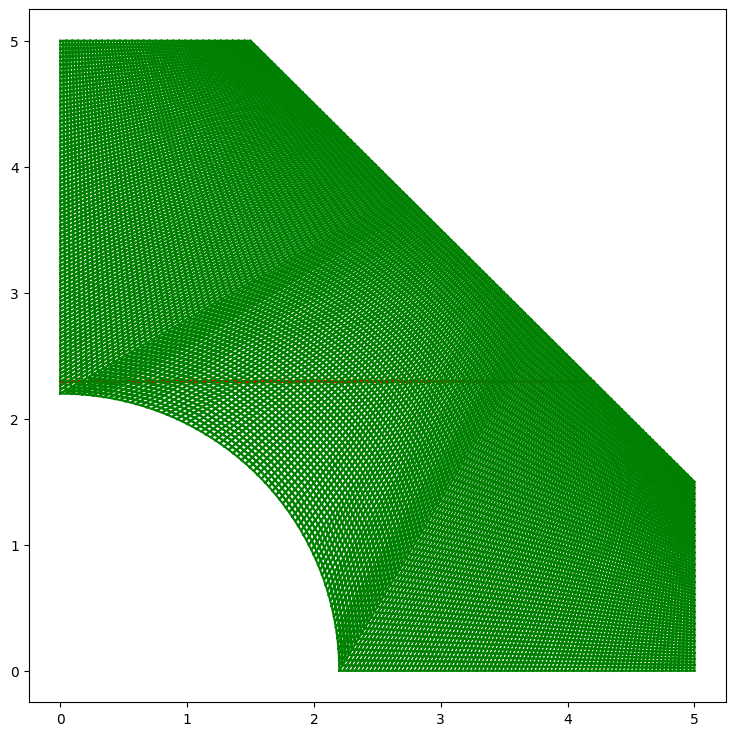

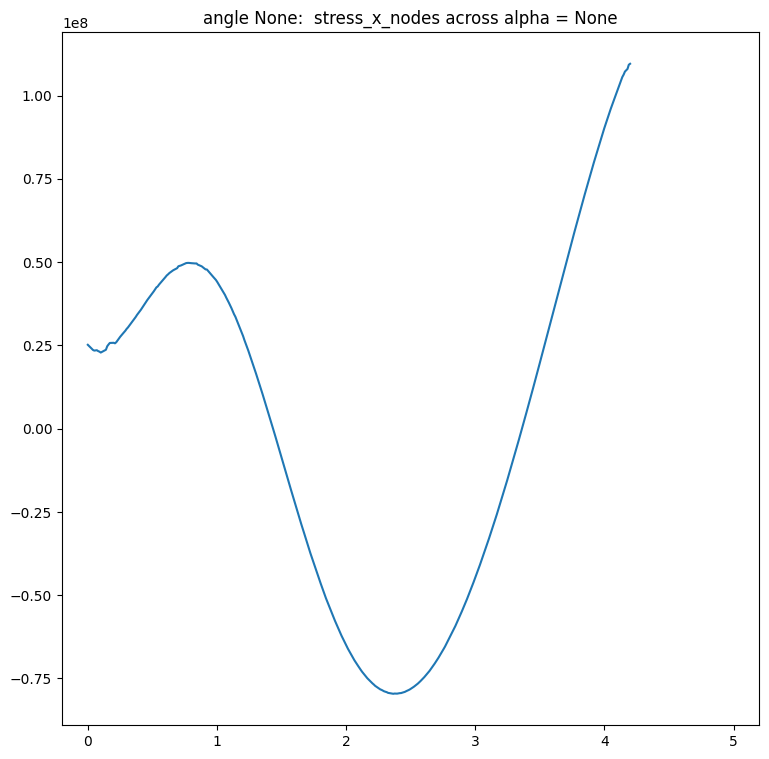

100%|██████████| 500/500 [00:00<00:00, 730.27it/s]


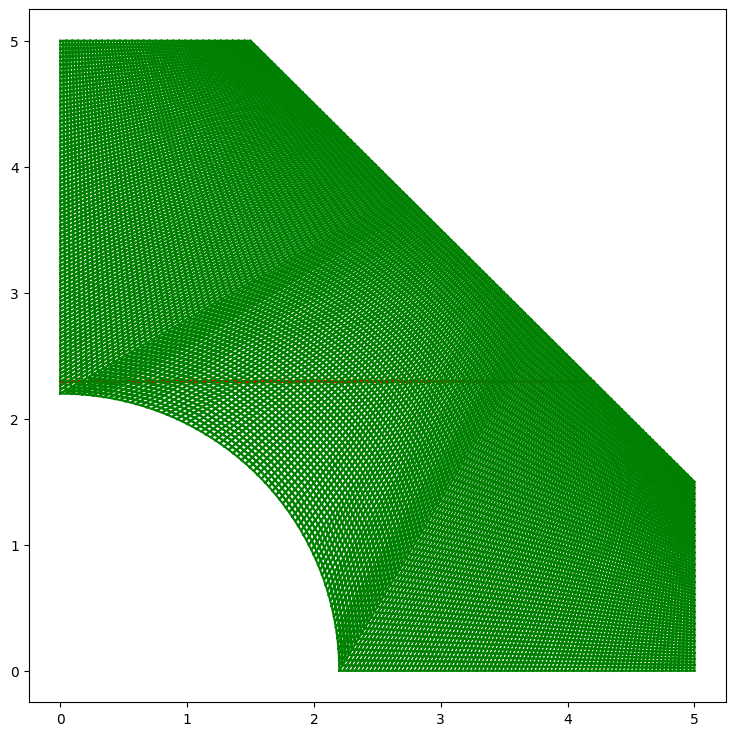

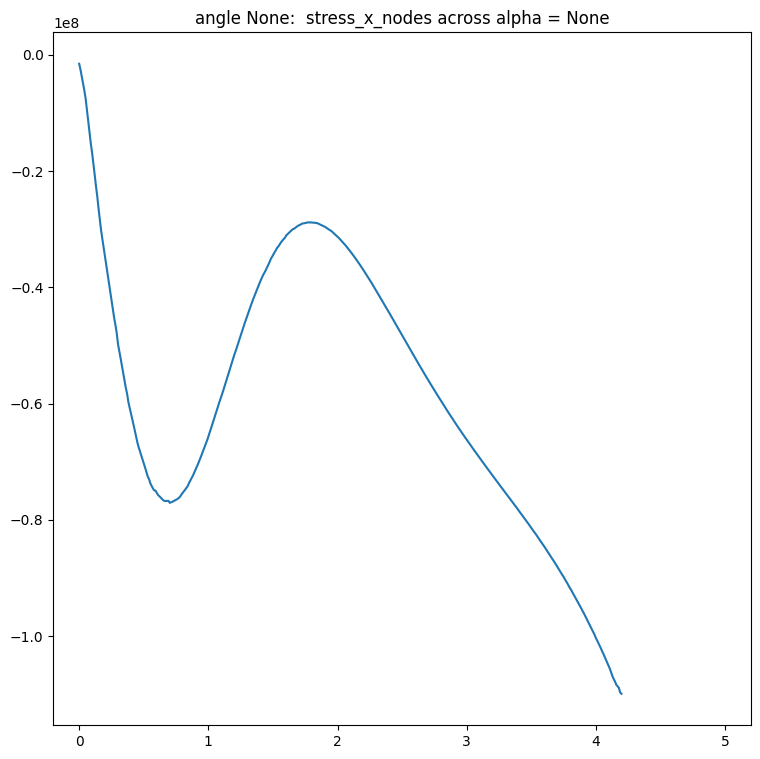

In [11]:
x_dct, y_dct, x_dct_nodes, y_dct_nodes = run_episode(fnames)

In [12]:
# x_dctlast, y_dctlast, x_dct_nodeslast, y_dct_nodeslast = run_episode(['0.01171875.k'])
# x_dct['0.01171875.k'] = x_dctlast
# y_dct['0.01171875.k'] = y_dctlast
# x_dct_nodes['0.01171875.k'] = x_dct_nodeslast
# y_dct_nodes['0.01171875.k'] = y_dct_nodeslast

100%|██████████| 4593/4593 [00:00<00:00, 1032834.99it/s]


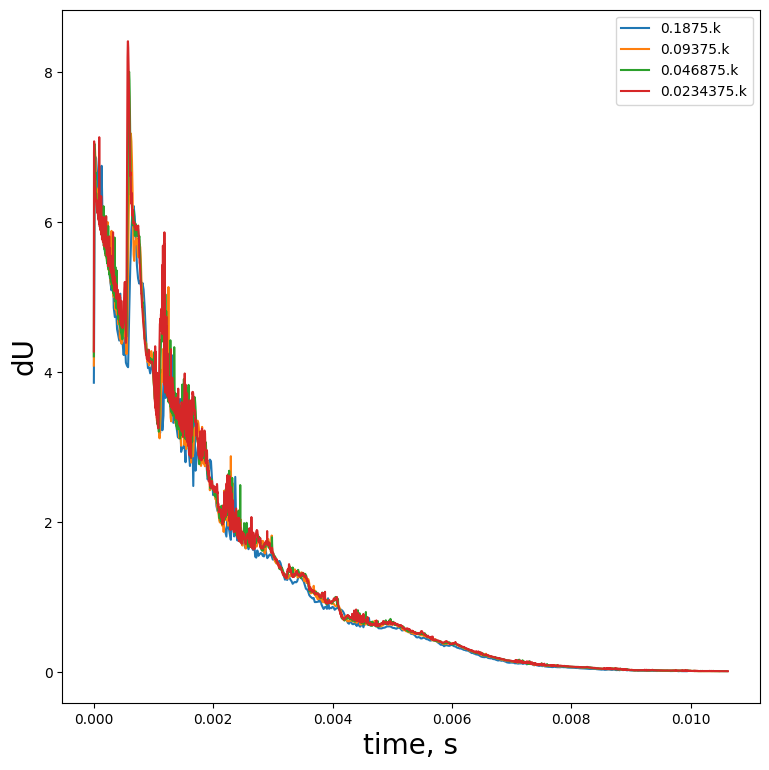

In [13]:
plt.figure(figsize = (9,9))
for name in fnames:
    with open(name+".pickle", "rb") as f:
        data = pickle.load(f)
        data = data[0]
        x = []
        y = []
        for elem in tqdm(data):
            x.append(elem[1])
            y.append(elem[3])
        plt.plot(x, y, label=name)
plt.xlabel('time, s',fontsize=20)
plt.ylabel('dU', fontsize=20)
plt.legend()
plt.show()

In [14]:
with open('x_dct.pickle', 'wb') as f:
    pickle.dump(x_dct, f)
with open('y_dct.pickle', 'wb') as f:
    pickle.dump(y_dct, f)

In [15]:
y_data = np.zeros((3*len(fnames), 500))
x_data = np.zeros((3*len(fnames), 500))
y_data_nodes = np.zeros((3*len(fnames), 500))
x_data_nodes = np.zeros((3*len(fnames), 500))
i=-1
for key in y_dct:
    i+=1
    y_data[i] = y_dct[key]
    x_data[i] = x_dct[key]
    y_data_nodes[i] = y_dct_nodes[key]
    x_data_nodes[i] = x_dct_nodes[key]

In [ ]:
print("MEAN DIFF:\n\n")
x1 = [0.09375, 0.046875, 0.0234375, 0.01171875] 
y1 = []
for i in range(1,len(fnames)):
    delta1 = np.nanmean(np.abs((y_data[3*i] - y_data[3*(i-1)]) / y_data[3*i])) * 100
    y1.append(delta1)
    print(f'Разница между решениями {i} и {i+1} для sigma_x до МР: {np.round(delta1,2)} %')
#plt.plot(x1, y1)
#plt.show()

y2 = []
for i in range(1,len(fnames)):
    delta2 = np.nanmean(np.abs((y_data[3*i+1] - y_data[3*(i-1)+1]) / y_data[3*i+1])) * 100
    y2.append(delta2)
    print(f'Разница между решениями {i} и {i+1} для sigma_y до МР: {np.round(delta2,2)} %')
#plt.plot(x1, y2)
#plt.show()

y3 = []
for i in range(1,len(fnames)):
    delta3 = np.nanmean(np.abs((y_data[3*i+2] - y_data[3*(i-1)+2]) / y_data[3*i]+2)) * 100
    y3.append(delta3)
    print(f'Разница между решениями {i} и {i+1} для sigma_xy до МР: {np.round(delta3,2)} %')
#plt.plot(x1, y3)
#plt.show()

y4 = []
for i in range(1,len(fnames)):
    delta4 = np.nanmean(np.abs((y_data_nodes[3*i] - y_data_nodes[3*(i-1)]) / y_data_nodes[3*i])) * 100
    y4.append(delta4)
    print(f'Разница между решениями {i} и {i+1} для sigma_x после МР: {np.round(delta4,2)} %')
#plt.plot(x1, y4)
#plt.show()

y5 = []
for i in range(1,len(fnames)):
    delta5 = np.nanmean(np.abs((y_data_nodes[3*i+1] - y_data_nodes[3*(i-1)+1]) / y_data_nodes[3*i+1])) * 100
    y5.append(delta5)
    print(f'Разница между решениями {i} и {i+1} для sigma_y после МР: {np.round(delta5,2)} %')
#plt.plot(x1, y5)
#plt.show()

y6 = []
for i in range(1,len(fnames)):
    delta6 = np.nanmean(np.abs((y_data_nodes[3*i+2] - y_data_nodes[3*(i-1)+2]) / y_data_nodes[3*i]+2)) * 100
    y6.append(delta6)
    print(f'Разница между решениями {i} и {i+1} для sigma_xy после МР: {np.round(delta6,2)} %')
#plt.plot(x1, y6)
#plt.show()

In [ ]:
print("MAX DIFF:\n\n")
x1 = [0.09375, 0.046875, 0.0234375, 0.01171875]
y1 = []
for i in range(1,len(fnames)):
    delta1 = np.nanmax(np.abs((y_data[3*i] - y_data[3*(i-1)]) / y_data[3*i])) * 100
    y1.append(delta1)
    print(f'Разница между решениями {i} и {i+1} для sigma_x до МР: {np.round(delta1,2)} %')
#plt.plot(x1, y1)
#plt.show()

y2 = []
for i in range(1,len(fnames)):
    delta2 = np.nanmax(np.abs((y_data[3*i+1] - y_data[3*(i-1)+1]) / y_data[3*i+1])) * 100
    y2.append(delta2)
    print(f'Разница между решениями {i} и {i+1} для sigma_y до МР: {np.round(delta2,2)} %')
#plt.plot(x1, y2)
#plt.show()

y3 = []
for i in range(1,len(fnames)):
    delta3 = np.nanmax(np.abs((y_data[3*i+2] - y_data[3*(i-1)+2]) / y_data[3*i]+2)) * 100
    y3.append(delta3)
    print(f'Разница между решениями {i} и {i+1} для sigma_xy до МР: {np.round(delta3,2)} %')
#plt.plot(x1, y3)
#plt.show()

y4 = []
for i in range(1,len(fnames)):
    delta4 = np.nanmax(np.abs((y_data_nodes[3*i] - y_data_nodes[3*(i-1)]) / y_data_nodes[3*i])) * 100
    y4.append(delta4)
    print(f'Разница между решениями {i} и {i+1} для sigma_x после МР: {np.round(delta4,2)} %')
#plt.plot(x1, y4)
#plt.show()

y5 = []
for i in range(1,len(fnames)):
    delta5 = np.nanmax(np.abs((y_data_nodes[3*i+1] - y_data_nodes[3*(i-1)+1]) / y_data_nodes[3*i+1])) * 100
    y5.append(delta5)
    print(f'Разница между решениями {i} и {i+1} для sigma_y после МР: {np.round(delta5,2)} %')
#plt.plot(x1, y5)
#plt.show()

y6 = []
for i in range(1,len(fnames)):
    delta6 = np.nanmax(np.abs((y_data_nodes[3*i+2] - y_data_nodes[3*(i-1)+2]) / y_data_nodes[3*i]+2)) * 100
    y6.append(delta6)
    print(f'Разница между решениями {i} и {i+1} для sigma_xy после МР: {np.round(delta6,2)} %')
#plt.plot(x1, y6)
#plt.show()

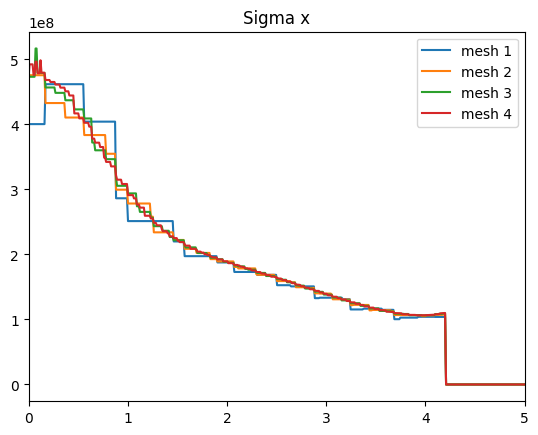

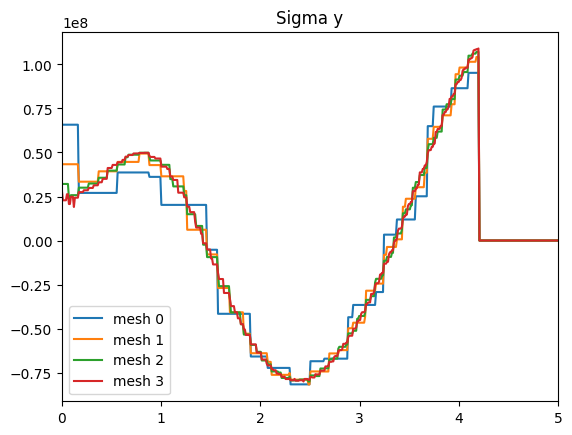

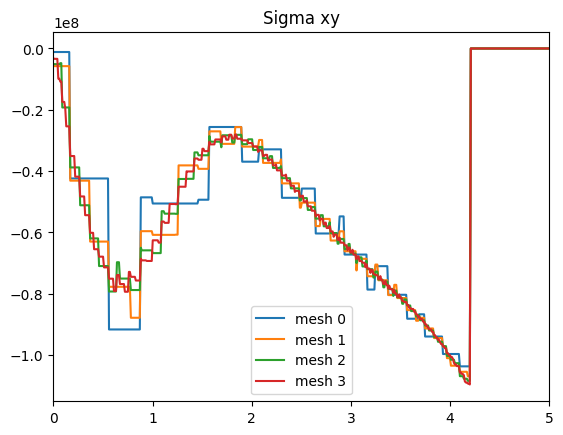

In [92]:
for i in range(len(fnames)):
  plt.plot(x_data[3*i], y_data[3*i], label="mesh "+str(i+1))
plt.xlim([0, 5])
plt.title("Sigma x")
plt.legend()
plt.show()

for i in range(len(fnames)):
  plt.plot(x_data[3*i+1], y_data[3*i+1], label="mesh "+str(i))
plt.xlim([0, 5])
plt.legend()
plt.title("Sigma y")
plt.show()

for i in range(len(fnames)):
  plt.plot(x_data[3*i+2], y_data[3*i+2], label="mesh "+str(i))
plt.xlim([0, 5])
plt.legend()
plt.title("Sigma xy")
plt.show()

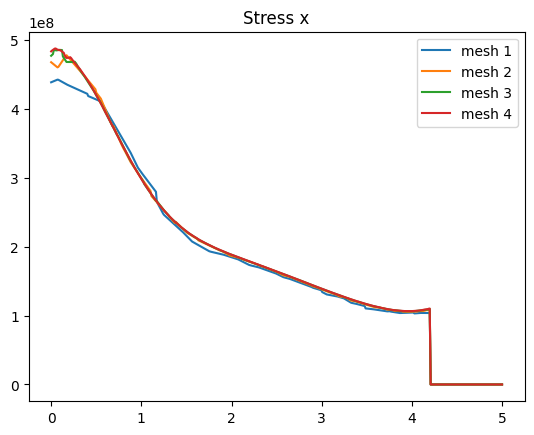

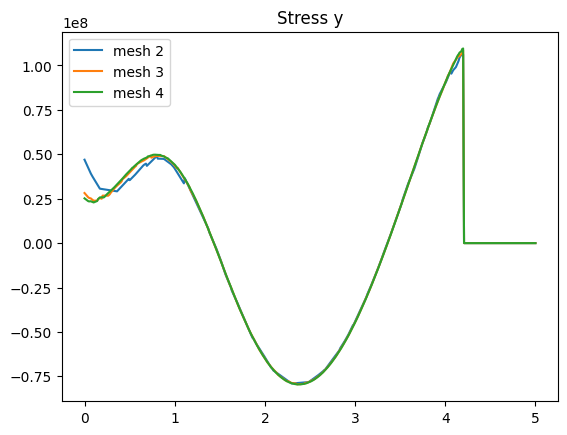

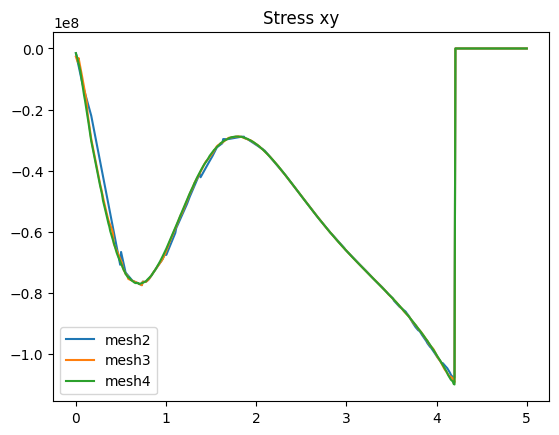

In [160]:
for i in range(len(fnames)):
  plt.plot(x_data_nodes[3*i], y_data_nodes[3*i], label="mesh "+str(i+1))
plt.title("Stress x")
plt.legend()
plt.show()

for i in range(1, len(fnames)):
  plt.plot(x_data_nodes[3*i+1], y_data_nodes[3*i+1], label="mesh "+str(i+1))
plt.title("Stress y")
plt.legend()
plt.show()

for i in range(1, len(fnames)):
  plt.plot(x_data_nodes[3*i+2], y_data_nodes[3*i+2], label="mesh"+str(i+1))
plt.legend()
plt.title("Stress xy")
plt.show()

In [ ]:
for i in range(len(fnames)):
  plt.plot(x_data_nodes[3*i], y_data_nodes[3*i], label="mesh "+str(i+1))
plt.title("Stress x")
plt.legend()
plt.show()

for i in range(len(fnames)):
  plt.plot(x_data_nodes[3*i+1], y_data_nodes[3*i+1], label="mesh "+str(i))
plt.title("Stress y")
plt.legend()
plt.show()

for i in range(len(fnames)):
  plt.plot(x_data_nodes[3*i+2], y_data_nodes[3*i+2], label="mesh"+str(i))
plt.title("Stress xy")
plt.show()

In [ ]:
for i in range(len(fnames)):
  plt.plot(x_data_nodes[3*i], y_data_nodes[3*i], label="mesh "+str(i+1)+" MR")
  plt.plot(x_data[3*i], y_data[3*i], label="mesh "+str(i+1))
  plt.title("Sigma_x")
  plt.legend()
  plt.show()

for i in range(len(fnames)):
  plt.plot(x_data_nodes[3*i+1], y_data_nodes[3*i+1], label="mesh "+str(i+1)+" MR")
  plt.plot(x_data[3*i+1], y_data[3*i+1], label="mesh "+str(i+1))
  plt.title("Sigma_y")
  plt.legend()
  plt.show()

for i in range(len(fnames)):
  plt.plot(x_data_nodes[3*i+2], y_data_nodes[3*i+2], label="mesh "+str(i+1)+" MR")
  plt.plot(x_data[3*i+2], y_data[3*i+2], label="mesh "+str(i+1))
  plt.title("Sigma_xy")
  plt.legend()
  plt.show()

In [ ]:
arrs = []
max = -1
names = ["stress_x", "stress_y", "stress_xy"]
# i - stresses
for i in range(3):
  name = names[i]
  # j - meshes
  for j in range(1, len(fnames)):
    max = -1
    # k - points
    for k in range(500):
      if y_data[j*3 + i][k] != 0:
        if np.abs((y_data[j*3 + i][k]-y_data[(j-1)*3 + i][k])/y_data[j*3 + i][k]) > max:
          max = np.abs((y_data[j*3 + i][k]-y_data[(j-1)*3 + i][k])/y_data[j*3 + i][k])
          print(f"Diff Between {name} Solutions {j} and {j-1} at point {k}: {np.round(max*100, 2)}%")      
    print(f"Max % Diff Between {name} Solutions {j} and {j-1}: {np.round(max*100, 2)}%")
  print("\n")

In [24]:
# print("MAX DIFF for sigma_x:\n\n")
# x1 = [0.09375]#, 0.046875, 0.0234375]#, 0.01171875]
# y1 = []
# for i in range(1,len(fnames)):
#     delta1 = np.nanmax(np.abs((y_data[3*i] - y_data[3*(i-1)]) / y_data[3*i])) * 100
#     y1.append(delta1)
#     print(f'Разница между решениями {i} и {i+1} для sigma_x до МР: {np.round(delta1,2)} %')
# #plt.plot(x1, y1)
# #plt.show()

In [128]:
print(x_data[0])

[0.         0.01002004 0.02004008 0.03006012 0.04008016 0.0501002
 0.06012024 0.07014028 0.08016032 0.09018036 0.1002004  0.11022044
 0.12024048 0.13026052 0.14028056 0.1503006  0.16032064 0.17034068
 0.18036072 0.19038076 0.2004008  0.21042084 0.22044088 0.23046092
 0.24048096 0.250501   0.26052104 0.27054108 0.28056112 0.29058116
 0.3006012  0.31062124 0.32064128 0.33066132 0.34068136 0.3507014
 0.36072144 0.37074148 0.38076152 0.39078156 0.4008016  0.41082164
 0.42084168 0.43086172 0.44088176 0.4509018  0.46092184 0.47094188
 0.48096192 0.49098196 0.501002   0.51102204 0.52104208 0.53106212
 0.54108216 0.5511022  0.56112224 0.57114228 0.58116232 0.59118236
 0.6012024  0.61122244 0.62124248 0.63126253 0.64128257 0.65130261
 0.66132265 0.67134269 0.68136273 0.69138277 0.70140281 0.71142285
 0.72144289 0.73146293 0.74148297 0.75150301 0.76152305 0.77154309
 0.78156313 0.79158317 0.80160321 0.81162325 0.82164329 0.83166333
 0.84168337 0.85170341 0.86172345 0.87174349 0.88176353 0.891783

In [125]:
for i in range(len(fnames)*3):
  print(y_data[i])

[4.00519881e+08 4.00519881e+08 4.00519881e+08 4.00519881e+08
 4.00519881e+08 4.00519881e+08 4.00519881e+08 4.00519881e+08
 4.00519881e+08 4.00519881e+08 4.00519881e+08 4.00519881e+08
 4.00519881e+08 4.00519881e+08 4.00519881e+08 4.00519881e+08
 4.00519881e+08 4.61927039e+08 4.61927039e+08 4.61927039e+08
 4.61927039e+08 4.61927039e+08 4.61927039e+08 4.61927039e+08
 4.61927039e+08 4.61927039e+08 4.61927039e+08 4.61927039e+08
 4.61927039e+08 4.61927039e+08 4.61927039e+08 4.61927039e+08
 4.61927039e+08 4.61927039e+08 4.61927039e+08 4.61927039e+08
 4.61927039e+08 4.61927039e+08 4.61927039e+08 4.61927039e+08
 4.61927039e+08 4.61927039e+08 4.61927039e+08 4.61927039e+08
 4.61927039e+08 4.61927039e+08 4.61927039e+08 4.61927039e+08
 4.61927039e+08 4.61927039e+08 4.61927039e+08 4.61927039e+08
 4.61927039e+08 4.61927039e+08 4.61927039e+08 4.61927039e+08
 4.04316599e+08 4.04316599e+08 4.04316599e+08 4.04316599e+08
 4.04316599e+08 4.04316599e+08 4.04316599e+08 4.04316599e+08
 4.04316599e+08 4.043165

In [126]:
for i in range(len(fnames)*3):
  print(y_data_nodes[i])

[4.38831063e+08 4.39380703e+08 4.39930343e+08 4.40479983e+08
 4.41029623e+08 4.41579263e+08 4.42128903e+08 4.42678543e+08
 4.42479101e+08 4.41734604e+08 4.40990107e+08 4.40245609e+08
 4.39501112e+08 4.38756615e+08 4.38012118e+08 4.37267620e+08
 4.36523123e+08 4.35794482e+08 4.35199160e+08 4.34603837e+08
 4.34008514e+08 4.33413191e+08 4.32817869e+08 4.32222546e+08
 4.31627223e+08 4.31031900e+08 4.30436577e+08 4.29841255e+08
 4.29245932e+08 4.28650609e+08 4.28055286e+08 4.27459963e+08
 4.26864641e+08 4.26269318e+08 4.25673995e+08 4.25078672e+08
 4.24483350e+08 4.23888027e+08 4.23292704e+08 4.22697381e+08
 4.22102058e+08 4.18864601e+08 4.18303831e+08 4.17743061e+08
 4.17182292e+08 4.16621522e+08 4.16060752e+08 4.15499982e+08
 4.14939213e+08 4.14378443e+08 4.13817673e+08 4.13256903e+08
 4.12696134e+08 4.12135364e+08 4.11574594e+08 4.11013825e+08
 4.08784175e+08 4.06526251e+08 4.04268327e+08 4.02010404e+08
 3.99752480e+08 3.97494556e+08 3.95236633e+08 3.92978709e+08
 3.90720785e+08 3.884628

In [161]:
y_data_nodes_1sem = [482706571.0858466, 484526326.04231244, 486396356.34060353, 488313549.8457388, 487689470.12012213, 486924168.4685147, 486204342.24773264, 485883759.4377419, 485611060.03816736, 485250237.056648, 484546607.0928534, 483789093.327007, 483052489.7450509, 482281769.8604453, 481462057.86621165, 480642345.871969, 479667079.19694227, 478660071.0772567, 477665125.93801117, 476517781.2248404, 475263523.8550656, 474009266.48528963, 472886248.0748822, 471891615.1676078, 470896982.2603407, 469311294.00669, 467448821.9427743, 465604050.79831636, 464659765.4250345, 464336405.9462793, 462517469.2890744, 460424795.55969703, 457978099.1733005, 456585768.4683966, 455112685.68622714, 452609957.54090416, 450478282.1861373, 448190908.07786113, 445809612.6038853, 444020631.7082595, 441982606.30827284, 439805367.91873085, 437692335.5770698, 435724489.55346954, 433780447.9048612, 431836406.2562516, 428571100.52782625, 425183015.7608676, 421922365.4851199, 420774030.4558707, 419736054.83148605, 418118062.184567, 415407219.30733204, 412616589.2531887, 410081545.17310256, 407664643.47157073, 405282240.97650033, 402886907.3452469, 400492827.79715776, 398097359.2039888, 395698810.18208826, 393137636.6184246, 390199587.4253497, 387352071.8897476, 384548763.89022785, 381770207.7437228, 379358148.84261775, 377089742.71642816, 374919733.7582797, 372749724.80012965, 370089337.0098276, 367346888.585989, 364662687.0349615, 362096023.366422, 359565221.4582027, 357026009.34087265, 354549991.0083327, 352093099.4351774, 349492041.76232135, 346988406.57429206, 344488675.2806791, 342044988.40543973, 339569216.06838286, 337071480.04882073, 334630413.67214066, 332266947.5882263, 329778176.75095767, 327351590.604975, 324973122.3414836, 322594654.077997, 320270526.2661805, 317976685.5057295, 315684445.4999274, 313433143.1286112, 311104133.7485801, 308804683.4020047, 306606501.92362547, 304408320.4452462, 302254419.7112276, 300075848.3142285, 297897276.9172293, 295834295.39850426, 293778102.9617001, 291631282.7023587, 289595429.2834939, 287572921.4101168, 285614397.5133982, 283648933.5290747, 281648721.0830977, 279747497.1335135, 277880378.95197964, 275983049.6958678, 274147825.48295194, 272315001.87969774, 270522646.267967, 268819321.6643, 267018951.68895975, 265291309.64789972, 263616979.92287266, 261941906.05367917, 260329155.59418547, 258696487.60974124, 257084320.21990535, 255575826.94269344, 254043306.3731294, 252467786.37483034, 250960104.24687243, 249444368.79069635, 248016008.95534894, 246659845.06031647, 245314178.83322364, 244055075.33228338, 242795971.83134302, 241485970.2334611, 240125896.2386936, 238765822.24392617, 237550596.5788321, 236354913.6186423, 235071118.32455006, 233865884.7879979, 232675542.44698948, 231477302.05690545, 230359977.5184062, 229249817.08101466, 228149918.65178937, 227108670.79435065, 226052591.20790026, 225016340.975424, 224047958.1699745, 223047186.3241827, 222074417.98920533, 221151273.6514712, 220228129.3137318, 219314939.22573555, 218410616.3144518, 217491059.58772057, 216625800.03806403, 215746744.0487195, 214867688.05937144, 214055855.61852273, 213239505.43738642, 212408145.23546508, 211633551.42094553, 210858957.6064277, 210090547.01201597, 209333302.82544553, 208576058.63887513, 207847692.44052148, 207134401.4919858, 206408266.71311358, 205718478.52439418, 205044802.1306659, 204356506.76560006, 203704821.73128018, 203059520.2357679, 202398790.26190862, 201753723.09878194, 201103508.80397055, 200470679.3055215, 199891995.56882718, 199297238.20931762, 198698049.90756392, 198095433.20015997, 197481739.43376818, 196911960.44529706, 196321190.83233893, 195747806.25884202, 195203249.8340657, 194664468.2592373, 194153587.0888352, 193519873.8942972, 192872210.70892888, 192233059.8511834, 191692156.53240716, 191274971.87926835, 190857787.2261278, 190427216.12905598, 189882356.5996971, 189338040.82506722, 188793725.0504338, 188283692.56270683, 187785807.03368407, 187287921.50466305, 186788590.36597657, 186288692.10738552, 185788793.84879273, 185289391.01376632, 184797949.80101085, 184306791.24090952, 183815632.68080646, 183327158.440202, 182839767.9479363, 182352377.4556689, 181866575.8224896, 181383062.61977273, 180899547.99378976, 180416144.03612852, 179934475.2221146, 179451804.0598011, 178969132.89748597, 178489190.83615968, 178012320.505247, 177535450.174336, 177059545.67920887, 176568623.0983858, 176074672.81463635, 175580722.53088197, 175118315.33851957, 174690493.93622196, 174262672.533926, 173828004.53522453, 173287677.99230817, 172747351.44939035, 172220158.95063615, 171717265.04367602, 171248706.67234612, 170793053.2002524, 170337399.72815865, 169827681.2836062, 169311288.0756396, 168831553.17061672, 168418174.21512866, 167999085.37095556, 167479498.56892103, 166935680.14591545, 166384345.27179706, 165867000.06481892, 165393881.6514567, 164919708.0864658, 164442492.72018206, 163947147.04556483, 163451643.07789156, 162952228.9472361, 162457891.1951686, 161965469.94781965, 161470867.6753132, 160974976.33468533, 160478977.33330938, 159982161.5715235, 159482783.9055622, 158984996.4290323, 158487208.95250237, 157986749.4569515, 157486448.38557088, 156986509.89929986, 156485260.12954658, 155982826.57696724, 155481562.89497334, 154980170.6414963, 154475935.68159333, 153972816.46078616, 153469784.92553908, 152965565.52703744, 152461562.27921733, 151958223.76978827, 151453644.91589582, 150945632.99953693, 150439054.47791508, 149932475.95629516, 149432922.25425145, 148936470.98236805, 148440348.06455874, 147925154.58831406, 147386423.51091826, 146847778.18544048, 146312463.7113983, 145843742.31032324, 145370885.1307663, 144897148.8483472, 144403931.5091767, 143893349.9737298, 143381940.88433596, 142869236.41295364, 142376075.010082, 141882913.6072122, 141389752.20434058, 140885998.45859075, 140381602.75909874, 139870827.51329467, 139360052.26748887, 138863143.76254058, 138375693.03040895, 137888242.29827523, 137403651.22265017, 136911099.4559399, 136414219.10030717, 135918337.65115947, 135426064.28629914, 134936888.2592779, 134447783.3559848, 133963232.72442354, 133479072.49839091, 132993736.0856969, 132511272.54032311, 132031857.05966154, 131552493.73637944, 131073921.55199501, 130600864.53130099, 130127807.51060897, 129654553.50162509, 129186709.28986551, 128720648.40439638, 128254594.56756711, 127791384.36085224, 127332553.18380669, 126873722.0067611, 126415170.14282952, 125966420.93420167, 125517671.72557387, 125068922.51694794, 124620247.1636648, 124171715.05075902, 123723182.93785322, 123284425.88762575, 122868836.99967968, 122453203.71910414, 122037570.43852669, 121551884.82309894, 121060348.59348172, 120568812.36386266, 120153844.9139376, 119798753.39148444, 119442692.14338769, 119086630.89529093, 118709123.94619262, 118303380.95792946, 117897918.89543808, 117492571.4056212, 117098672.01571803, 116731028.3332078, 116363354.10628448, 115995526.26449925, 115630387.84781352, 115277863.2814977, 114925338.71518044, 114573347.26840393, 114222854.33666122, 113895867.81526309, 113568881.29386775, 113241239.02378875, 112905358.97940159, 112588776.54285419, 112273891.92708452, 111959007.31131344, 111651265.52681078, 111383548.28142017, 111115831.03603338, 110848186.55414972, 110574243.54479355, 110300300.53543736, 110042670.59548944, 109793831.98287328, 109543750.11969495, 109320943.88090295, 109097289.23197106, 108863735.80190907, 108666762.52858996, 108467526.0432862, 108263408.23334102, 108089992.73260953, 107916577.23187983, 107745549.72295094, 107591096.80589402, 107435239.3474745, 107308408.00016743, 107186093.96441981, 107063779.9286704, 106949556.59513573, 106817473.83012892, 106719137.15393472, 106767064.03185296, 106790087.83363602, 106733702.36733544, 106580508.1998136, 106433217.92569207, 106459887.18083104, 106486556.43597002, 106515861.67313483, 106526743.35511097, 106544255.2821139, 106599652.62227257, 106662245.58992541, 106743214.3407437, 106834097.72995561, 106948757.02307543, 107082335.43454583, 107215913.84601517, 107377258.98739463, 107538506.09587136, 107715470.3956189, 107928391.73671699, 108154671.69730048, 108406326.7832527, 108653157.06562158, 108919061.41804808, 109196072.64172527, 109485326.19991775, 109909343.34748313, 110333360.49504855, 110767649.37520942, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

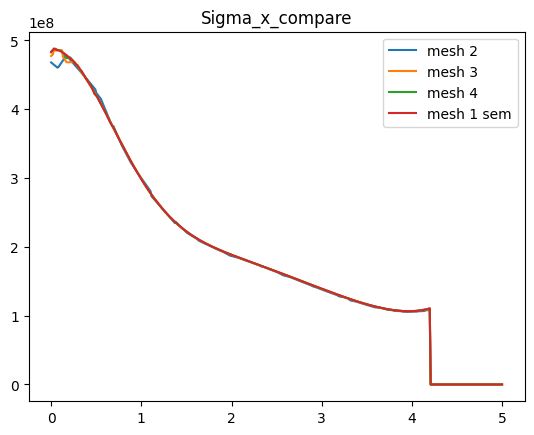

In [165]:
for i in range(1, len(fnames)):
  plt.plot(x_data[0], y_data_nodes[3*i], label = "mesh "+str(i+1))
plt.plot(x_data[0], y_data_nodes_1sem, label='mesh 1 sem')
plt.title("Sigma_x_compare")
plt.legend()
plt.show()

In [ ]:
for i in range(len(fnames)):
  max = -1
  for j in range(500):
    if np.abs(y_data_nodes[3*i][j]-y_data_nodes_1sem[j])/np.abs(y_data_nodes[3*i][j])*100 > max:
      max = np.abs(y_data_nodes[3*i][j]-y_data_nodes_1sem[j])/np.abs(y_data_nodes[3*i][j])*100
  print(f"Max % Diff for 1sem solution and mesh {i+1} : {np.round(max, 2)}%")